In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
import tensorflow as tf

## Data loading

In [3]:
#data preprocessing

# load and prepare training images
def load_real_samples(filename):
	# load compressed arrays
	data = np.load(filename)
	# unpack arrays
	X1, X2 = data['x'], data['y']
	# scale from [0,255] to [-1,1]
	# X1 = (X1 - 127.5) / 127.5
	# X2 = (X2 - 127.5) / 127.5
	return [X1, X2]

In [3]:
#dataset loading and splitting between test and train
train_data_tot = np.loadtxt("F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite\Padded_Train_total_AVHRR_unscaled_data_1981_2022.txt").reshape(2000,192,128)
test_data_tot = np.loadtxt("F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite\Padded_Test_total_AVHRR_unscaled_data_1981_2022.txt").reshape(123,192,128)
train_data = np.concatenate((train_data_tot[:],test_data_tot[:11]),axis=0)
test_data = test_data_tot[11:]
Xtrain = train_data[:-1] 
ytrain = train_data[1:] #label is the next time step image
Xtest = test_data[:-1]
ytest = test_data[1:]
print(train_data.shape,test_data.shape,train_data.max(),test_data.max())
print(Xtrain.shape,Xtest.shape,ytrain.shape,ytest.shape)

(2011, 192, 128) (112, 192, 128) 100.0 100.0
(2010, 192, 128) (111, 192, 128) (2010, 192, 128) (111, 192, 128)


In [4]:
#dataset loading and splitting between test and train
train_data = np.loadtxt("F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite\Padded_Train_total_AVHRR_unscaled_data_1981_2022.txt").reshape(2000,192,128)
test_data = np.loadtxt("F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite\Padded_Test_total_AVHRR_unscaled_data_1981_2022.txt").reshape(123,192,128)
Xtrain = train_data[:-1] 
ytrain = train_data[1:] #label is the next time step image
Xtest = test_data[:-1]
ytest = test_data[1:]
print(train_data.shape,test_data.shape,train_data.max(),test_data.max())
print(Xtrain.shape,Xtest.shape,ytrain.shape,ytest.shape)

(2000, 192, 128) (123, 192, 128) 100.0 100.0
(1999, 192, 128) (122, 192, 128) (1999, 192, 128) (122, 192, 128)


In [65]:
dataset = load_real_samples("F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite\paired_arrays_train_total_AVHRR_data.npz")
dataset_test = load_real_samples('F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite\paired_arrays_test_total_AVHRR_data.npz')
train_dataset_tot, train_labels_tot = dataset[0],dataset[1]
test_dataset_tot, test_labels_tot = dataset_test[0], dataset_test[1]
train_dataset, train_labels = np.concatenate((train_dataset_tot[:],test_dataset_tot[:11]),axis=0), np.concatenate((train_labels_tot[:],test_labels_tot[:11]),axis=0)
test_dataset, test_labels = test_dataset_tot[11:],test_labels_tot[11:]
# Inspect the dataset.
print("Training Dataset Shapes: " + str(train_dataset.shape) + ", " + str(train_labels.shape))
print("Validation Dataset Shapes: " + str(test_dataset.shape) + ", " + str(test_labels.shape))

Training Dataset Shapes: (2010, 192, 128, 1), (2010, 192, 128, 1)
Validation Dataset Shapes: (111, 192, 128, 1), (111, 192, 128, 1)


In [5]:
dataset = load_real_samples("F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite\paired_arrays_train_total_AVHRR_data.npz")
dataset_test = load_real_samples('F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite\paired_arrays_test_total_AVHRR_data.npz')
train_dataset, train_labels = dataset[0],dataset[1]
test_dataset, test_labels = dataset_test[0], dataset_test[1]
# Inspect the dataset.
print("Training Dataset Shapes: " + str(train_dataset.shape) + ", " + str(train_labels.shape))
print("Validation Dataset Shapes: " + str(test_dataset.shape) + ", " + str(test_labels.shape))

Training Dataset Shapes: (1999, 192, 128, 1), (1999, 192, 128, 1)
Validation Dataset Shapes: (122, 192, 128, 1), (122, 192, 128, 1)


In [66]:
rf_dataset = load_real_samples("F:\Jyoti Shukla -MS\Rainfall data\paired_arrays_train_total_scaled_rainfall_data.npz")
rf_dataset_test = load_real_samples('F:\Jyoti Shukla -MS\Rainfall data\paired_arrays_test_total_scaled_rainfall_data.npz')
rf_train_dataset_tot, rf_train_labels_tot = rf_dataset[0],rf_dataset[1]
rf_test_dataset_tot, rf_test_labels_tot = rf_dataset_test[0], rf_dataset_test[1]
rf_train_dataset, rf_train_labels = np.concatenate((rf_train_dataset_tot[:],rf_test_dataset_tot[:11]),axis=0), np.concatenate((rf_train_labels_tot[:],rf_test_labels_tot[:11]),axis=0)
rf_test_dataset, rf_test_labels = rf_test_dataset_tot[11:],rf_test_labels_tot[11:]
# Inspect the dataset.
print("Training Dataset Shapes: " + str(rf_train_dataset.shape) + ", " + str(rf_train_labels.shape))
print("Validation Dataset Shapes: " + str(rf_test_dataset.shape) + ", " + str(rf_test_labels.shape))

Training Dataset Shapes: (2010, 192, 128, 1), (2010, 192, 128, 1)
Validation Dataset Shapes: (95, 192, 128, 1), (95, 192, 128, 1)


In [4]:
rf_dataset = load_real_samples("F:\Jyoti Shukla -MS\Rainfall data\paired_arrays_train_total_scaled_rainfall_data.npz")
rf_dataset_test = load_real_samples('F:\Jyoti Shukla -MS\Rainfall data\paired_arrays_test_total_scaled_rainfall_data.npz')
rf_train_dataset, rf_train_labels = rf_dataset[0],rf_dataset[1]
rf_test_dataset, rf_test_labels = rf_dataset_test[0], rf_dataset_test[1]
# Inspect the dataset.
print("Training Dataset Shapes: " + str(rf_train_dataset.shape) + ", " + str(rf_train_labels.shape))
print("Validation Dataset Shapes: " + str(rf_test_dataset.shape) + ", " + str(rf_test_labels.shape))

Training Dataset Shapes: (1999, 192, 128, 1), (1999, 192, 128, 1)
Validation Dataset Shapes: (106, 192, 128, 1), (106, 192, 128, 1)


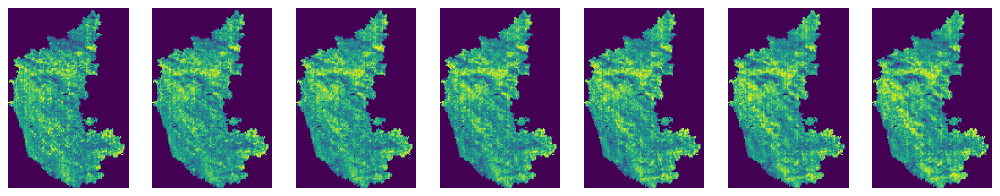

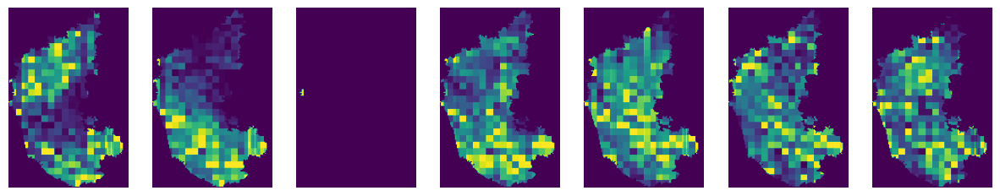

In [6]:
from matplotlib import pyplot
idx = np.random.randint(0, len(dataset[0]),7)
plt.figure(figsize=(15,15))
for i in range(len(idx)):
    #define subplot
    pyplot.subplot(1,7,1+i)
    #turn off acis
    pyplot.axis('off')
    #plot raw pixel data
    pyplot.imshow(dataset[0][i].reshape(192,128))
    #show title
    #pyplot.title(titles[i])
pyplot.show()
plt.figure(figsize=(15,15))
for i in range(len(idx)):
    #define subplot
    pyplot.subplot(1,7,1+i)
    #turn off acis
    pyplot.axis('off')
    #plot raw pixel data
    pyplot.imshow(rf_dataset[0][i].reshape(192,128))
    #show title
    #pyplot.title(titles[i])
pyplot.show()

In [66]:
test_dataset[:106].shape

(106, 192, 128, 1)

In [67]:
rf_vhi_train = np.concatenate((train_dataset, rf_train_dataset),axis=3)
print(rf_vhi_train.shape)
rf_vhi_test = np.concatenate((test_dataset[:95], rf_test_dataset), axis = 3)
print(rf_vhi_test.shape)

(2010, 192, 128, 2)
(95, 192, 128, 2)


In [7]:
rf_vhi_train = np.concatenate((train_dataset, rf_train_dataset),axis=3)
print(rf_vhi_train.shape)
rf_vhi_test = np.concatenate((test_dataset[:106], rf_test_dataset), axis = 3)
print(rf_vhi_test.shape)

(1999, 192, 128, 2)
(106, 192, 128, 2)


In [11]:
np.max(rf_vhi_train)

1.0

In [48]:
a = [2,3,4,5,6,78,5]
a[:2]

[2, 3]

In [83]:
rf_vhi_train[0][:,:,0].shape

(192, 128)

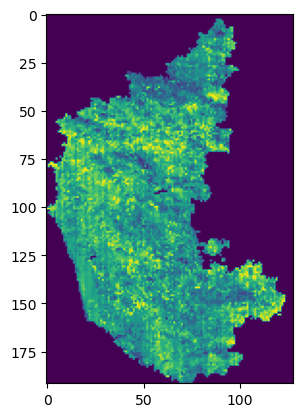

In [9]:
plt.imshow(rf_vhi_train[0][:,:,0])

# Sampling temporally

In [12]:
# split a univariate sequence into samples
def split_sequence(sequence, lab_sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence        
        # if end_ix > len(sequence)-1:
        #     break
        if end_ix == 1999:
            seq_x, seq_y = sequence[i], test_dataset[0]
        elif end_ix == 2000:
            seq_x, seq_y = sequence[i], test_dataset[1]
        elif end_ix == 2001:
            seq_x, seq_y = sequence[i], test_dataset[2]
        else:
            seq_x, seq_y = sequence[i], lab_sequence[end_ix]
        # gather input and output parts of the pattern
        
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), n_steps

In [68]:
# split a univariate sequence into samples
def split_sequence(sequence, lab_sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence        
        # if end_ix > len(sequence)-1:
        #     break
        if end_ix == 2010:
            seq_x, seq_y = sequence[i], test_dataset[0]
        elif end_ix == 2011:
            seq_x, seq_y = sequence[i], test_dataset[1]
        elif end_ix == 2012:
            seq_x, seq_y = sequence[i], test_dataset[2]
        # elif end_ix == 2013:
        #     seq_x, seq_y = sequence[i], test_dataset[3]
        # elif end_ix == 2014:
        #     seq_x, seq_y = sequence[i], test_dataset[4]
        else:
            seq_x, seq_y = sequence[i], lab_sequence[end_ix]
        # gather input and output parts of the pattern
        
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), n_steps

X_train, y_train, n_steps = split_sequence(rf_vhi_train, train_dataset,2)
print(X_train.shape, y_train.shape)
X_train_flattened = X_train.reshape(2010,49152)
y_train_flattened = y_train.reshape(2010,24576)
print(X_train_flattened.shape, y_train_flattened.shape)

(2010, 192, 128, 2) (2010, 192, 128, 1)
(2010, 49152) (2010, 24576)


In [8]:
# split a univariate sequence into samples
def split_sequence(sequence, lab_sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence        
        # if end_ix > len(sequence)-1:
        #     break
        if end_ix == 1999:
            seq_x, seq_y = sequence[i], test_dataset[0]
        # elif end_ix == 2011:
        #     seq_x, seq_y = sequence[i], test_dataset[1]
        # elif end_ix == 2012:
        #     seq_x, seq_y = sequence[i], test_dataset[2]
        else:
            seq_x, seq_y = sequence[i], lab_sequence[end_ix]
        # gather input and output parts of the pattern
        
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), n_steps

X_train, y_train, n_steps = split_sequence(rf_vhi_train, train_dataset,1)
print(X_train.shape, y_train.shape)
X_train_flattened = X_train.reshape(1999,49152)
y_train_flattened = y_train.reshape(1999,24576)
print(X_train_flattened.shape, y_train_flattened.shape)

(1999, 192, 128, 2) (1999, 192, 128, 1)
(1999, 49152) (1999, 24576)


In [32]:
X_train, y_train, n_steps = split_sequence(rf_vhi_train, train_dataset,2)
print(X_train.shape, y_train.shape)
X_train_flattened = X_train.reshape(1999,49152)
y_train_flattened = y_train.reshape(1999,24576)
print(X_train_flattened.shape, y_train_flattened.shape)

(1999, 192, 128, 2) (1999, 192, 128, 1)
(1999, 49152) (1999, 24576)


In [39]:
np.unique(y_train[0].reshape(192,128))

array([0.        , 0.07811237, 0.09546926, ..., 0.99936116, 0.99999994,
       1.        ], dtype=float32)

In [40]:
np.unique(train_dataset[2])

array([0.        , 0.07811237, 0.09546926, ..., 0.99936116, 0.99999994,
       1.        ], dtype=float32)

In [44]:
scaler = MinMaxScaler()
scaled = scaler.fit_transform(ytrain[1].reshape(192,128))
unscaled = scaler.inverse_transform(scaled.reshape(192,128))
np.unique(scaled), np.unique(ytrain[1]), np.unique(unscaled)

(array([0.        , 0.07811237, 0.09546926, ..., 0.99936116, 1.        ,
        1.        ]),
 array([  0.        ,   7.73000002,   8.26000023, ...,  99.61000061,
         99.69999695, 100.        ]),
 array([  0.        ,   7.73000002,   8.26000023, ...,  99.61000061,
         99.69999695, 100.        ]))

In [9]:
def split_sequence(sequence, lab_sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence        
        # if end_ix > len(sequence)-1:
        #     break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i], lab_sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), n_steps

In [70]:
X_test, y_test, n_steps = split_sequence(rf_vhi_test, test_dataset,2)
print(X_test.shape, y_test.shape)
X_test_flattened = X_test.reshape(95, 49152)
y_test_flattened = y_test.reshape(95,24576)
print(X_test_flattened.shape, y_test_flattened.shape)

(95, 192, 128, 2) (95, 192, 128, 1)
(95, 49152) (95, 24576)


In [10]:
X_test, y_test, n_steps = split_sequence(rf_vhi_test, test_dataset,1)
print(X_test.shape, y_test.shape)
X_test_flattened = X_test.reshape(106, 49152)
y_test_flattened = y_test.reshape(106,24576)
print(X_test_flattened.shape, y_test_flattened.shape)

(106, 192, 128, 2) (106, 192, 128, 1)
(106, 49152) (106, 24576)


In [34]:
X_test, y_test, n_steps = split_sequence(rf_vhi_test, test_dataset,2)
print(X_test.shape, y_test.shape)
X_test_flattened = X_test.reshape(106, 49152)
y_test_flattened = y_test.reshape(106,24576)
print(X_test_flattened.shape, y_test_flattened.shape)

(106, 192, 128, 2) (106, 192, 128, 1)
(106, 49152) (106, 24576)


## *LR*

In [71]:
# Fitting Multiple Linear Regression to the Training set 
from sklearn.linear_model import LinearRegression 
regressor = LinearRegression() 
regressor.fit(X_train_flattened, y_train_flattened)

LinearRegression()

In [72]:
#Predicting the Test set result 
y_pred = regressor.predict(X_test_flattened)
print(y_pred.shape)

(95, 24576)


In [36]:
#Predicting the Test set result 
y_pred = regressor.predict(X_test_flattened)
print(y_pred.shape)

(106, 24576)


In [74]:
from sklearn.metrics import mean_squared_error 
print("The Mean Squared Error is: {}".format(mean_squared_error(y_test_flattened, y_pred)))

The Mean Squared Error is: 0.014882415533065796


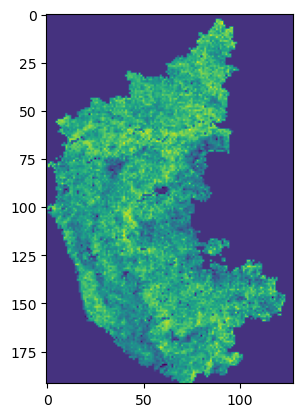

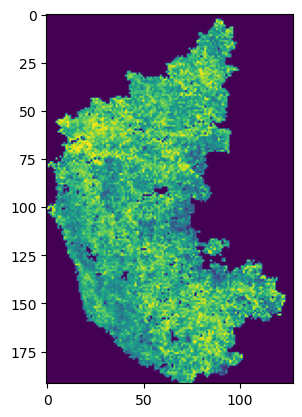

In [61]:
img = y_pred[0].reshape(192,128)
y_real = y_test_flattened[0].reshape(192,128)
plt.imshow(img)
plt.show()
plt.imshow(y_real)

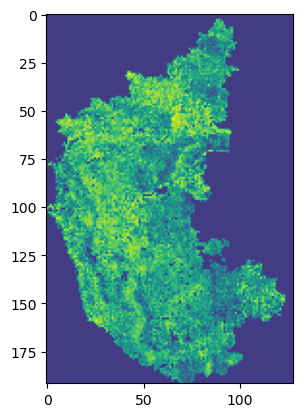

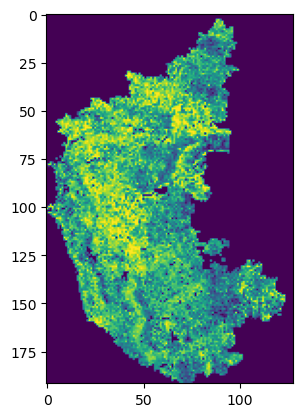

In [37]:
img = y_pred[0].reshape(192,128)
y_real = y_test_flattened[0].reshape(192,128)
plt.imshow(img)
plt.show()
plt.imshow(y_real)

In [93]:
len(X_test_flattened[2:])

104

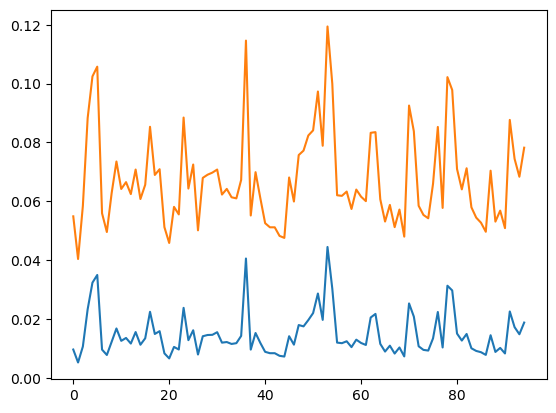

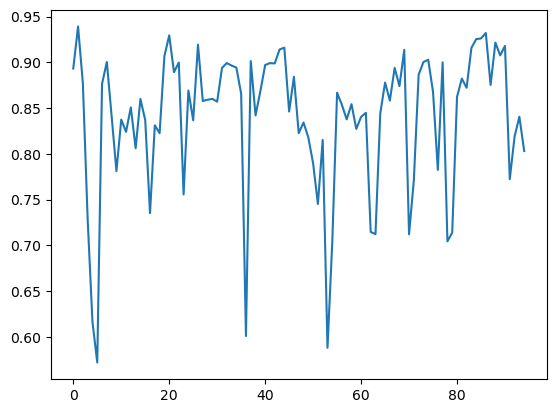

In [73]:
MSE_LR =[]
R2_LR = []
MAE_LR =[]
preds = []
for i in range(len(X_test_flattened)):
    pred = y_pred[i].reshape(192,128)
    yreal = y_test_flattened[i].reshape(192,128)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_LR.append(err)
    R2_LR.append(r2)
    MAE_LR.append(abs_err)
# print(MSE_LR)
# np.save("F:\Jyoti Shukla -MS\codes\RF_VHI_codes\conference rfvhi outputs/R2_score_LR_rf_vhi_3timestep_2010.npy", R2_LR)
# np.save("F:\Jyoti Shukla -MS\codes\RF_VHI_codes\conference rfvhi outputs/MSE_score_LR_rf_vhi_3timestep_2010.npy", MSE_LR)
# np.save("F:\Jyoti Shukla -MS\codes\RF_VHI_codes\conference rfvhi outputs/MAE_score_LR_rf_vhi_3timestep_2010.npy", MAE_LR)
# np.save("F:\Jyoti Shukla -MS\codes\RF_VHI_codes\conference rfvhi outputs/predicted_LR_rf_vhi_3timestep_2010.npy", preds)
# #np.save("MSE_for_LR.npy", MSE_LR)
plt.plot(MSE_LR)
plt.plot(MAE_LR)
plt.show()
plt.plot(R2_LR)


In [34]:
np.max(R2_LR)

0.9392816447729924

In [63]:
np.max(R2_LR)

0.922890747719695

In [95]:
print(MSE_LR)

[0.0021311862, 0.0107619995, 0.007280168, 0.0074775373, 0.0072283056, 0.011103656, 0.00587089, 0.006357145, 0.01974057, 0.016165541, 0.0063023996, 0.013340602, 0.0083014555, 0.012907485, 0.023143068, 0.030028827, 0.0328196, 0.011454677, 0.008577745, 0.013712527, 0.018499378, 0.01445307, 0.014494162, 0.013221696, 0.015129274, 0.011993922, 0.01515316, 0.02266218, 0.012858203, 0.015369833, 0.0080900695, 0.006591898, 0.010704255, 0.009338003, 0.02361218, 0.012691565, 0.015513706, 0.007917893, 0.012784685, 0.015327911, 0.013835529, 0.01611241, 0.0126765855, 0.012380892, 0.011133224, 0.011802756, 0.015457641, 0.04357452, 0.010450616, 0.01648181, 0.012977757, 0.009104418, 0.009334862, 0.008314592, 0.008298644, 0.009646492, 0.016091567, 0.013933875, 0.020060439, 0.019871192, 0.02660529, 0.019152392, 0.030527769, 0.02055151, 0.049065314, 0.035007317, 0.013084485, 0.013132809, 0.01372285, 0.01089946, 0.012888698, 0.012911761, 0.01188752, 0.022496756, 0.020682655, 0.0118080415, 0.008676349, 0.010

In [3]:
R2_LR = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_LR_rf_vhi.npy")
R2_LR_sub = R2_LR[1:]
print(R2_LR_sub)

[0.88304911 0.92546552 0.91820186 0.91730507 0.87695005 0.93167651
 0.92523498 0.7836386  0.81578845 0.92396654 0.84764801 0.90289667
 0.85112534 0.72978554 0.64349353 0.59579663 0.85312428 0.89035084
 0.82246918 0.75975092 0.81389182 0.81269517 0.83154987 0.8117243
 0.8509613  0.81660754 0.73298135 0.85427751 0.82820532 0.90939611
 0.92974933 0.88738637 0.90282018 0.75750317 0.87042946 0.84342801
 0.9196342  0.87155964 0.85189872 0.86780899 0.85169779 0.88774777
 0.89767601 0.90015987 0.8941738  0.85477995 0.57127469 0.89317102
 0.83013756 0.85661999 0.89429417 0.88876618 0.90051473 0.90677592
 0.89147393 0.82748291 0.8594173  0.80350564 0.81413632 0.75733443
 0.8174568  0.72883405 0.8086453  0.54846585 0.66008509 0.85526126
 0.83778333 0.82108183 0.84801652 0.82790857 0.82599937 0.83507501
 0.68772478 0.72550935 0.84121694 0.88215159 0.85868011 0.89589845
 0.86861735 0.91110931 0.72395913 0.78856282 0.89097342 0.89882835
 0.90022498 0.86787862 0.77090504 0.89801427 0.69229257 0.73776

In [4]:
np.max(R2_LR_sub), np.mean(R2_LR_sub)

(0.9319126263168322, 0.8386957248588209)

In [74]:
np.mean(R2_LR), np.max(R2_LR),np.mean(MSE_LR), np.mean(MAE_LR)

(0.8404352462547422, 0.9392816447729924, 0.01487219, 0.06761251)

In [39]:
np.mean(R2_LR), np.max(R2_LR),np.mean(MSE_LR), np.mean(MAE_LR)

(0.8399905343179084, 0.9759455275220656, 0.014882416, 0.06737672)

In [23]:
# for 2010 samples and 1 timestamp 
np.mean(R2_LR), np.max(R2_LR),np.mean(MSE_LR), np.mean(MAE_LR)

(0.9162707089181491, 0.9709829105602695, 0.007620506, 0.048351653)

In [36]:
# for 2010 samples and 2 timestamp 
np.mean(R2_LR), np.max(R2_LR),np.mean(MSE_LR), np.mean(MAE_LR)

(0.8404352462547422, 0.9392816447729924, 0.01487219, 0.06761251)

In [64]:
# for 2010 samples and 3 timestamp 
np.mean(R2_LR), np.max(R2_LR),np.mean(MSE_LR), np.mean(MAE_LR)

(0.7418507111446113, 0.922890747719695, 0.023803554, 0.085151404)

In [54]:
# for 2010 samples and 4 timestamp 
np.mean(R2_LR), np.max(R2_LR),np.mean(MSE_LR), np.mean(MAE_LR)

(0.4251240347790864, 0.9103337852367193, 0.05199756, 0.122146554)

In [166]:
a= [[1,2],[2,3]]
b = [[2,3],[1,4]]
c = []
c.append(a)
c.append(b)
c.append([[1,2],[10,19]])
c

[[[1, 2], [2, 3]], [[2, 3], [1, 4]], [[1, 2], [10, 19]]]

# ConvLSTM + Conv3D Model

Data Preparing

In [188]:
test_dataset[0:2].shape

(2, 192, 128, 1)

In [8]:
# split a univariate sequence into samples
def split_sequence(sequence, lab_sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence        
        if end_ix > len(sequence)-2:
            print(i)
            break
        # if end_ix == 1998:
        #     seq_x, seq_y = sequence[i:end_ix], lab_sequence[1998:]
        # if end_ix == 1999:
        #     seq_x, seq_y = sequence[i:end_ix], test_dataset[0:2]
        # elif end_ix == 2000:
        #     seq_x, seq_y = sequence[i:end_ix], test_dataset[1:3]
        # elif end_ix == 2001:
        #     seq_x, seq_y = sequence[i:end_ix], test_dataset[2:4]
        #else:
        
        seq_x, seq_y = sequence[i:end_ix], lab_sequence[i+2:end_ix+2]
        # gather input and output parts of the pattern
        
        X.append(seq_x)
        y.append(seq_y)
    X.append(sequence[1997:1999])
    y.append(test_dataset[0:2])
    return np.array(X), np.array(y), n_steps

In [9]:
X_train, y_train, n_steps = split_sequence(rf_vhi_train, train_dataset,2)
print(X_train.shape, y_train.shape)
# X_train_flattened = X_train.reshape(1999,49152)
# y_train_flattened = y_train.reshape(1999,24576)
# print(X_train_flattened.shape, y_train_flattened.shape)


1996
(1997, 2, 192, 128, 2) (1997, 2, 192, 128, 1)


In [10]:
# split a univariate sequence into samples
def split_sequence(sequence, lab_sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence        
        if end_ix > len(sequence)-2:
            break
        seq_x, seq_y = sequence[i:end_ix], lab_sequence[i+2:end_ix+2]
        # gather input and output parts of the pattern        
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), n_steps

In [11]:
X_test, y_test, n_steps = split_sequence(rf_vhi_test, test_dataset,2)
print(X_test.shape, y_test.shape)

(103, 2, 192, 128, 2) (103, 2, 192, 128, 1)


ConvLSTM_Conv3D_Model

In [4]:
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import History 
from tensorflow import keras
import tensorflow_addons as tfa
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, ConvLSTM2D, Flatten, Dropout, MaxPooling2D,MaxPooling3D, TimeDistributed, Conv2D, LSTM, SimpleRNN, UpSampling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.ensemble import AdaBoostClassifier
from sklearn.preprocessing import MinMaxScaler
from tensorflow import keras
from tensorflow.keras import layers

In [13]:
inp = layers.Input(shape=(None, *X_train.shape[2:]))
inp.shape

TensorShape([None, None, 192, 128, 2])

In [14]:
x = layers.ConvLSTM2D(
    filters=16,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(inp)
#x = layers.BatchNormalization()(x)
x = tfa.layers.GroupNormalization(groups =4)(x)
#x = layers.MaxPooling3D((2, 2, 2), padding='same')(x)
x = layers.ConvLSTM2D(
    filters=32,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
#x = layers.BatchNormalization()(x)
x = tfa.layers.GroupNormalization(groups =8)(x)
#x = layers.MaxPooling3D((2, 2, 2), padding='same')(x)
x = layers.Dropout(0.3)(x)

x = layers.ConvLSTM2D(
    filters=64,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
#x = layers.BatchNormalization()(x)
x = tfa.layers.GroupNormalization(groups =16)(x)
#x = layers.Dropout(0.3)(x)
#x = layers.UpSampling3D((2, 2,2))(x)

x = layers.ConvLSTM2D(
    filters=128,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
x = tfa.layers.GroupNormalization(groups =32)(x)
#x = layers.BatchNormalization()(x)

# x = layers.ConvLSTM2D(
#     filters=256,
#     kernel_size=(3, 3),
#     padding="same",
#     return_sequences=True,
#     activation="relu",
# )(x)
# x = tfa.layers.GroupNormalization(groups =64)(x)

x = layers.ConvLSTM2D(
    filters=32,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)

x = tfa.layers.GroupNormalization(groups =8)(x)
#x = layers.UpSampling3D((2, 2, 2))(x)
# x = layers.Dropout(0.3)(x)
x = layers.ConvLSTM2D(
    filters=16,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
#x = layers.BatchNormalization()(x)
x = tfa.layers.GroupNormalization(groups =4)(x)
x = layers.Conv3D(
    filters=1, kernel_size=(3, 3, 3), activation="sigmoid", padding="same"
)(x)
huber_loss = tf.keras.losses.Huber(delta=0.01)
# Next, we will build the complete model and compile it.
model = keras.models.Model(inp, x)
model.compile(
    loss= huber_loss, optimizer=keras.optimizers.SGD(learning_rate=0.1),metrics=[tf.keras.metrics.mse]
)
model.summary()



Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, 192, 128, 2 0         
_________________________________________________________________
conv_lst_m2d (ConvLSTM2D)    (None, None, 192, 128, 16 10432     
_________________________________________________________________
group_normalization (GroupNo (None, None, 192, 128, 16 32        
_________________________________________________________________
conv_lst_m2d_1 (ConvLSTM2D)  (None, None, 192, 128, 32 55424     
_________________________________________________________________
group_normalization_1 (Group (None, None, 192, 128, 32 64        
_________________________________________________________________
dropout (Dropout)            (None, None, 192, 128, 32 0         
_________________________________________________________________
conv_lst_m2d_2 (ConvLSTM2D)  (None, None, 192, 128, 64 221440

In [15]:
# Define some callbacks to improve training.
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=10)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=5)

# Define modifiable training hyperparameters.
epochs = 10
batch_size = 1

# Fit the model to the training data.
history = model.fit(
    X_train,
    y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping, reduce_lr],
)

model.save("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi/convlstm_conv3d_rf_AVHRR_model.h5")

# Results of updated model
np.save('F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi/convlstm_conv3d_rf_AVHRR_model_history.npy',history.history)

Epoch 1/10
1997/1997 [==============================] - 1680s 834ms/step - loss: 8.3167e-04 - mean_squared_error: 0.0207 - val_loss: 6.9658e-04 - val_mean_squared_error: 0.0168
Epoch 2/10
1997/1997 [==============================] - 1641s 822ms/step - loss: 6.1514e-04 - mean_squared_error: 0.0130 - val_loss: 6.4024e-04 - val_mean_squared_error: 0.0144
Epoch 3/10
1997/1997 [==============================] - 1641s 822ms/step - loss: 5.6811e-04 - mean_squared_error: 0.0114 - val_loss: 5.9551e-04 - val_mean_squared_error: 0.0124
Epoch 4/10
1997/1997 [==============================] - 1641s 822ms/step - loss: 5.3966e-04 - mean_squared_error: 0.0104 - val_loss: 5.6966e-04 - val_mean_squared_error: 0.0114
Epoch 5/10
1997/1997 [==============================] - 1641s 822ms/step - loss: 5.2018e-04 - mean_squared_error: 0.0098 - val_loss: 5.4982e-04 - val_mean_squared_error: 0.0106
Epoch 6/10
1997/1997 [==============================] - 1641s 822ms/step - loss: 5.0523e-04 - mean_squared_error: 0

In [6]:
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import History 
from tensorflow import keras
import tensorflow_addons as tfa
import numpy as np
import matplotlib.pyplot as plt
model= load_model("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Saved_models_and_model_history_rf_vhi\convlstm_conv3d_rf_AVHRR_model_9.h5")
history=np.load('F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Saved_models_and_model_history_rf_vhi\convlstm_conv3d_rf_AVHRR_model_history_9.npy',allow_pickle='TRUE').item()
history.keys()

dict_keys(['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error', 'lr'])

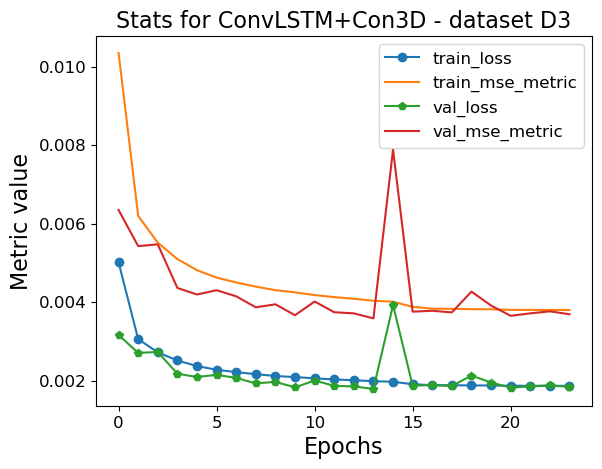

In [7]:
# Results of updated model

plt.plot(history['loss'],'-o')
plt.plot(history['mean_squared_error'])
plt.plot(history['val_loss'],'-p')
plt.plot(history['val_mean_squared_error'])

plt.title('Stats for ConvLSTM+Con3D - dataset D3', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Epochs', fontsize=16)
plt.ylabel('Metric value', fontsize=16)
plt.legend(['train_loss','train_mse_metric','val_loss','val_mse_metric'], fontsize=12)
plt.show()

mse 0.015172313
r2 score is: 0.7983889376645538 

discrete values, predicted and real respectively: 0.7717171 1.0


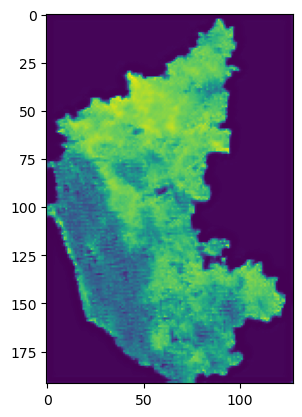

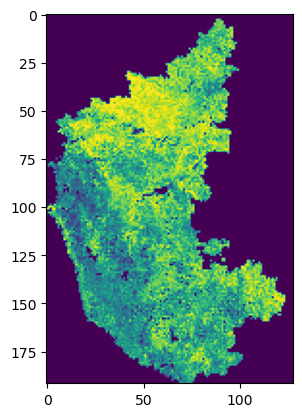

In [23]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error as mse
framed = X_test[36][0:1,...]
pred = model.predict(np.expand_dims(framed, axis=0))
y_real = y_test[36][0]
pred = pred.reshape(192,128,1)
plt.imshow(pred.reshape(192,128))
plt.figure()
plt.imshow(y_real.reshape(192,128))
r2 = r2_score(y_real.reshape(192,128),pred.reshape(192,128))
mse = mse(y_real.reshape(192,128),pred.reshape(192,128))
print("mse",mse)
print("r2 score is:", r2,"\n")
pred = pred.reshape(192,128)
y_real = y_real.reshape(192,128)
print("discrete values, predicted and real respectively:",(pred.reshape(192,128))[50][30],(y_real.reshape(192,128))[50][30])

In [29]:
X_test[0][0].shape

(192, 128, 2)

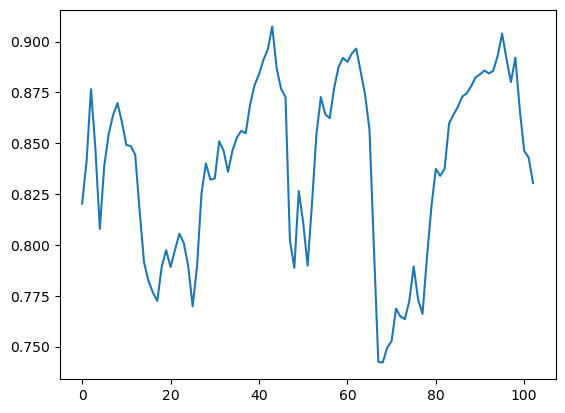

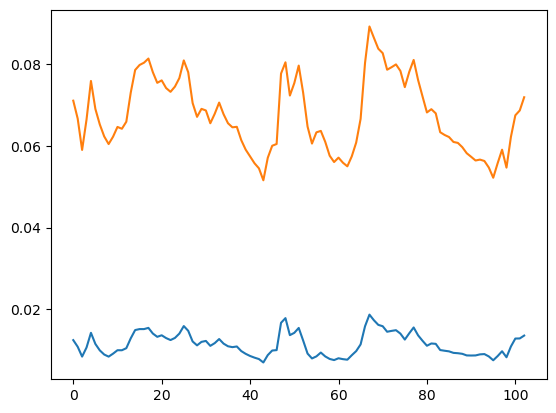

In [16]:
from sklearn.metrics import mean_squared_error as mse
data = X_test
label = y_test
predicted =[]
true = []
R2 =[]
res = []
MSE =[]
for i in range(len(data)):
    #for j in range(4):
    framed = data[i][0]
    y_real = label[i][0].reshape(192,128)
    test = framed.reshape(1,1,192,128,2)
    pred = model.predict(test)
    pred = pred.reshape(192,128)
    r2 = r2_score(y_real,pred)
    residual = mae(y_real,pred)
    err = mse(y_real,pred.reshape(192,128))
    MSE.append(err)
    res.append(residual)
    predicted.append(pred)
    true.append(y_real)
    R2.append(r2)
plt.plot(R2)
plt.show()
plt.plot(MSE)
plt.show
plt.plot(res)
np.save("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Saved_models_and_model_history_rf_vhi\predicted_test_convlstm_9.npy", predicted)

In [17]:
np.max(R2), np.mean(R2), np.mean(MSE), np.mean(res)

(0.907446455958128, 0.8384792050722725, 0.011492281, 0.067539014)

## *Pix2Pix GAN Model*

Data Processing

In [9]:
rf_vhi_train = np.concatenate((train_dataset, rf_train_dataset),axis=3)
print(rf_vhi_train.shape)
rf_vhi_test = np.concatenate((test_dataset[:106], rf_test_dataset), axis = 3)
print(rf_vhi_test.shape)

(1999, 192, 128, 2)
(106, 192, 128, 2)


In [10]:
train_dataset, train_labels = dataset[0],dataset[1]
test_dataset, test_labels = dataset_test[0], dataset_test[1]
# Inspect the dataset.
print("Training Dataset Shapes: " + str(train_dataset.shape) + ", " + str(train_labels.shape))
print("Validation Dataset Shapes: " + str(test_dataset.shape) + ", " + str(test_labels.shape))

Training Dataset Shapes: (1999, 192, 128, 1), (1999, 192, 128, 1)
Validation Dataset Shapes: (122, 192, 128, 1), (122, 192, 128, 1)


In [11]:
# split a univariate sequence into samples
def split_sequence(sequence, lab_sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence        
        # if end_ix > len(sequence)-1:
        #     break
        if end_ix == 1999:
            seq_x, seq_y = sequence[i], test_dataset[0]
        elif end_ix == 2000:
            seq_x, seq_y = sequence[i], test_dataset[1]
        elif end_ix == 2001:
            seq_x, seq_y = sequence[i], test_dataset[2]
        else:
            seq_x, seq_y = sequence[i], lab_sequence[end_ix]
        # gather input and output parts of the pattern
        
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), n_steps

In [12]:
X_train, y_train, n_steps = split_sequence(rf_vhi_train, train_dataset,2)
print(X_train.shape, y_train.shape)

(1999, 192, 128, 2) (1999, 192, 128, 1)


In [13]:
def split_sequence(sequence, lab_sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence        
        # if end_ix > len(sequence)-1:
        #     break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i], lab_sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), n_steps

In [14]:
X_test, y_test, n_steps = split_sequence(rf_vhi_test, test_dataset,2)
print(X_test.shape, y_test.shape)

(106, 192, 128, 2) (106, 192, 128, 1)


In [43]:
# pairing data and labels
x = X_train
y = y_train
np.savez("F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite/paired_arrays_train_total_rf_vhi_data.npz",x = x , y = y)

In [44]:
x= X_test
y= y_test
np.savez("F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite/paired_arrays_test_total_rf_vhi_data.npz",x = x , y = y)

## *GAN_Model*

In [15]:
# example of pix2pix gan for satellite to map image-to-image translation
from numpy import load
import numpy as np
import tensorflow as tf
from numpy import zeros
from numpy import ones
from numpy.random import randint
from tensorflow.keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from keras.layers import LeakyReLU
from matplotlib import pyplot
import matplotlib

In [16]:
# define the discriminator model
def define_discriminator(image_shape, label_shape):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# source image input
	in_src_image = Input(shape=image_shape)
	# target image input
	in_target_image = Input(shape=label_shape)
	# concatenate images channel-wise
	merged = Concatenate()([in_src_image, in_target_image])
	# C64
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C128
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C512
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# second last output layer
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# patch output
	d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	patch_out = Activation('sigmoid')(d)
	# define model
	model = Model([in_src_image, in_target_image], patch_out)
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss=tf.keras.losses.BinaryCrossentropy(), optimizer=opt, loss_weights=[0.5])
	return model

In [17]:
# define an encoder block
def define_encoder_block(layer_in, n_filters, batchnorm=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add downsampling layer
	g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# conditionally add batch normalization
	if batchnorm:
		g = BatchNormalization()(g, training=True)
	# leaky relu activation
	g = LeakyReLU(alpha=0.2)(g)
	return g
 
# define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add upsampling layer
	g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# add batch normalization
	g = BatchNormalization()(g, training=True)
	# conditionally add dropout
	if dropout:
		g = Dropout(0.5)(g, training=True)
	# merge with skip connection
	g = Concatenate()([g, skip_in])
	# relu activation
	g = Activation('relu')(g)
	return g
 
# define the standalone generator model
def define_generator(image_shape= (190,124,)):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# image input
	in_image = Input(shape=image_shape)
	# encoder model
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	# e6 = define_encoder_block(e5, 512)
	# e7 = define_encoder_block(e6, 512)
	# bottleneck, no batch norm and relu
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e5)
	b = Activation('relu')(b)
	# decoder model
	# d1 = decoder_block(b, e7, 512)
	# d2 = decoder_block(d1, e6, 512)
	d3 = decoder_block(b, e5, 512)
	d4 = decoder_block(d3, e4, 512, dropout=False)
	d5 = decoder_block(d4, e3, 256, dropout=False)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	d7 = decoder_block(d6, e1, 64, dropout=False)
	# output
	g = Conv2DTranspose(1, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
	out_image = Activation('sigmoid')(g)
	# define model
	model = Model(in_image, out_image)
	return model

In [18]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model, image_shape):
	# make weights in the discriminator not trainable
	for layer in d_model.layers:
		if not isinstance(layer, BatchNormalization):
			layer.trainable = False
	# define the source image
	in_src = Input(shape=image_shape)
	# connect the source image to the generator input
	gen_out = g_model(in_src)
	# connect the source input and generator output to the discriminator input
	dis_out = d_model([in_src, gen_out])
	# src image as input, generated image and classification output
	model = Model(in_src, [dis_out, gen_out])
	# compile model
	opt = Adam(learning_rate=0.0002, beta_1=0.5)
	huber_loss = tf.keras.losses.Huber(delta=0.5)
	model.compile(loss=['mse', huber_loss], optimizer=opt, loss_weights=[1,100])
	return model

In [19]:
# load and prepare training images
def load_real_samples(filename):
	# load compressed arrays
	data = np.load(filename)
	# unpack arrays
	x1, x2 = data['x'], data['y']
	X1, X2 = x1[:], x2[:]
	# scale from [0,255] to [-1,1]
	# X1 = (X1 - 127.5) / 127.5
	# X2 = (X2 - 127.5) / 127.5
	return [X1, X2]

In [20]:
# select a batch of random samples, returns images and target
def generate_real_samples(dataset, n_samples, patch_shape):
	# unpack dataset
	trainA, trainB = dataset
	# choose random instances
	ix = randint(0, trainA.shape[0], n_samples)
	#print(ix)
	# retrieve selected images
	X1, X2 = trainA[ix], trainB[ix]
	# generate 'real' class labels (1)
	y = ones((n_samples, patch_shape[1], patch_shape[2], 1))
	return [X1, X2], y
 
# generate a batch of images, returns images and targets
def generate_fake_samples(g_model, samples, patch_shape):
	# generate fake instance
	X = g_model.predict(samples)
	# create 'fake' class labels (0)
	y = zeros((len(X), patch_shape[1], patch_shape[2], 1))
	return X, y

In [21]:
# generate samples and save as a plot and save the model
def summarize_performance(step, g_model, dataset, n_samples =3):
  #select a sample of input images
  patch = np.ones((1,1,1))
  [X_realA, X_realB],_ = generate_real_samples(dataset, n_samples,patch.shape)
  #generate a batch of fake samples
  X_fakeB, _ = generate_fake_samples(g_model, X_realA, patch.shape)
  #scale all pixels from [-1,-1] to [0,1]
  # X_realA = (X_realA +1)/ 2.0
  # X_realB = (X_realB +1)/2.0
  # X_fakeB = (X_fakeB +1)/2.0
  for i in range(n_samples):
    #name = '/content/drive/MyDrive/Drought_Dataset/AVHRR data/Output_plots_model_2/generated_image_'+str(step+1) + str(i)+'.jpg'
    name = 'F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\gan_lstm_rf_vhi\model_2_dummy/generated_image_'+str(step+1) + str(i)+'.jpg'
    matplotlib.image.imsave(name, X_fakeB[i].reshape(192,128))
  #plot real source images
  for i in range(n_samples):
    pyplot.subplot(3, n_samples, 1+i)
    pyplot.axis('off')
    pyplot.imshow(X_realA[i][:,:,0].reshape(192,128))
  # plot generated target image
  for i in range(n_samples):
    pyplot.subplot(3, n_samples, 1+ n_samples + i)
    pyplot.axis('off')
    pyplot.imshow(X_fakeB[i].reshape(192,128))
  #plot real target image
  for i in range(n_samples):
    pyplot.subplot(3, n_samples, 1+ n_samples*2 + i)
    pyplot.axis('off')
    pyplot.imshow(X_realB[i].reshape(192,128))
  # save plot to file
  #filename1 = '/content/drive/MyDrive/Drought_Dataset/AVHRR data/Output_plots_model_2/plot_%06d.png' % (step+1)
  filename1 = 'F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\gan_lstm_rf_vhi\model_2_dummy/plot_%06d.png' % (step+1)
  pyplot.savefig(filename1)
  pyplot.close()
  # save the generator model
  #filename2 = '/content/drive/MyDrive/Drought_Dataset/AVHRR data/Output_plots_model_2/model_%06d.h5' % (step+1)
  filename2 = 'F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\gan_lstm_rf_vhi\model_2_dummy/model_%06d.h5' % (step+1)
  g_model.save(filename2)
  print('>Saved: %s and %s' %(filename1, filename2))

In [85]:
patch = np.ones((1,1,1))
dataset = load_real_samples("F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite\paired_arrays_train_total_rf_vhi_data.npz")
[X_realA, X_realB],y_real = generate_real_samples(dataset, 3, patch.shape)
X_realA.shape, X_realB.shape

((3, 192, 128, 2), (3, 192, 128, 1))

In [54]:
X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, patch.shape)
X_fakeB.shape, y_fake.shape

((3, 192, 128, 1), (3, 1, 1, 1))

In [61]:
label_shape = dataset[1].shape[1:]
image_shape = dataset[0].shape[1:]
image_shape,label_shape

((192, 128, 2), (192, 128, 1))

In [63]:
image_shape = dataset[0].shape[1:]
label_shape = dataset[1].shape[1:]
# define the models
d_model = define_discriminator(image_shape, label_shape)
g_model = define_generator(image_shape)


c:\Users\user\anaconda3\envs\tf-gpu\lib\site-packages\keras\optimizer_v2\optimizer_v2.py:355: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(


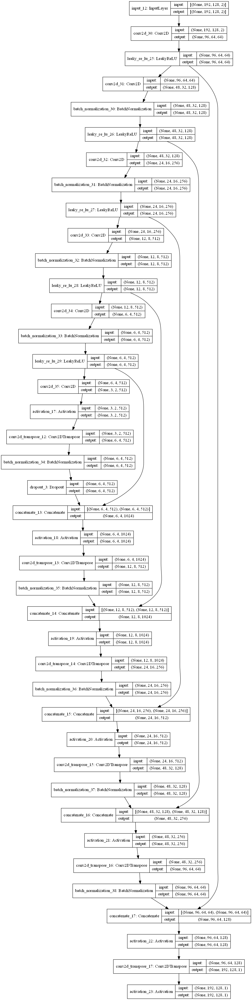

In [57]:
tf.keras.utils.plot_model(g_model, show_shapes=True)

In [ ]:
tf.keras.utils.plot_model(d_model, show_shapes=True)

In [65]:
gan_model = define_gan(g_model, d_model, image_shape)

In [ ]:
tf.keras.utils.plot_model(gan_model, show_shapes=True)

In [22]:
# train pix2pix models
def train(d_model, g_model, gan_model, dataset, n_epochs=10, n_batch=1):
	# determine the output square shape of the discriminator
	n_patch = d_model.output_shape
	# unpack dataset
	trainA, trainB = dataset
	# calculate the number of batches per training epoch
	bat_per_epo = int(len(trainA) / n_batch)
	# calculate the number of training iterations
	n_steps = bat_per_epo * n_epochs
	disc_loss =[]
	disc_loss_real =[]
	gen_loss =[]
	# manually enumerate epochs
	for i in range(1000):
		# select a batch of real samples
		[X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
		# generate a batch of fake samples
		X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
		# update discriminator for real samples
		d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
		# update discriminator for generated samples
		d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
		disc_loss.append(d_loss2)
		disc_loss_real.append(d_loss1)
		# update the generator
		g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
		gen_loss.append(g_loss)
		# summarize performance
		print('>%d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1, d_loss2, g_loss))
		# summarize model performance
		if (i+1) % 1000 == 0:
			summarize_performance(i, g_model, dataset)
	return disc_loss_real, disc_loss, gen_loss

In [23]:
# load image data
#dataset = load_real_samples("/content/drive/MyDrive/Drought_Dataset/AVHRR data/paired_padded_arrays_train_AVHRR_data.npz")
dataset = load_real_samples("F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite\paired_arrays_train_total_rf_vhi_data.npz")
print('Loaded', dataset[0].shape, dataset[1].shape)
# define input shape based on the loaded dataset
image_shape = dataset[0].shape[1:]
label_shape = dataset[1].shape[1:]
# define the models
d_model = define_discriminator(image_shape, label_shape)
g_model = define_generator(image_shape)
d_model.summary()
g_model.summary()
# define the composite model
gan_model = define_gan(g_model, d_model, image_shape)
# train model
disc_loss_real, disc_loss_gen, gen_loss = train(d_model, g_model, gan_model, dataset)

Loaded (1999, 192, 128, 2) (1999, 192, 128, 1)


c:\Users\user\anaconda3\envs\tf-gpu\lib\site-packages\keras\optimizer_v2\optimizer_v2.py:355: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 192, 128, 2) 0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 192, 128, 1) 0                                            
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, 192, 128, 3)  0           input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 96, 64, 64)   3136        concatenate[0][0]            

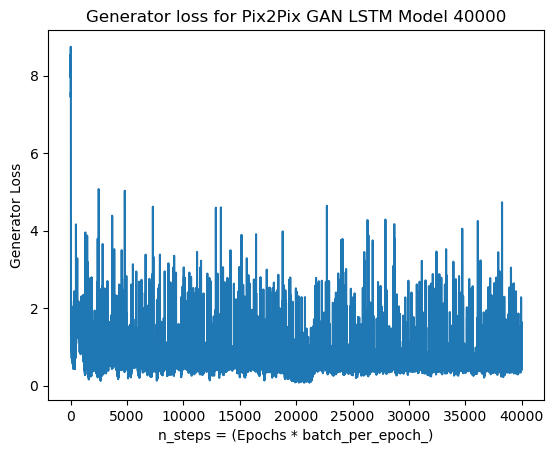

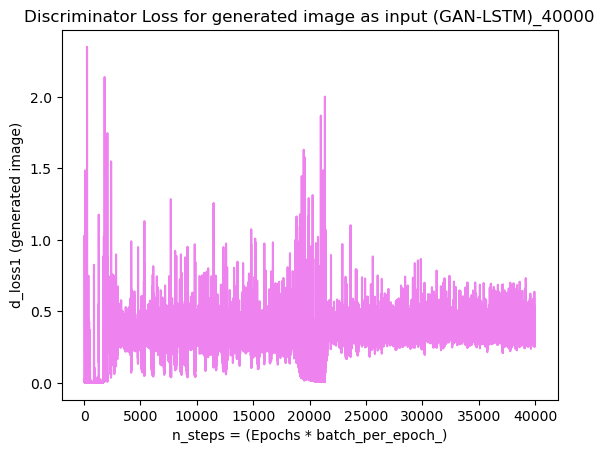

Text(0.5, 1.0, 'Discriminator Loss for real image as input(GAN-LSTM) 40000')

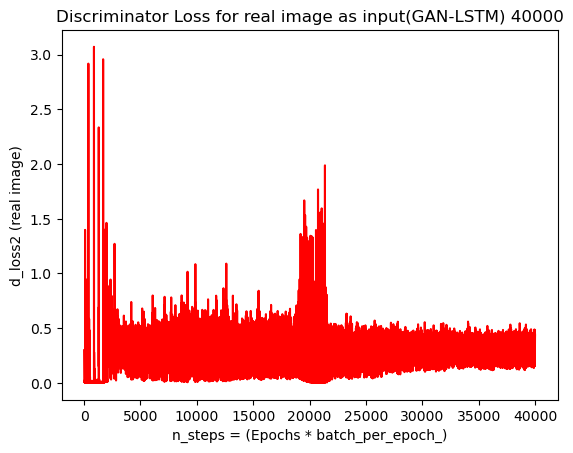

In [29]:
import matplotlib.pyplot as plt
plt.plot(gen_loss)
plt.xlabel("n_steps = (Epochs * batch_per_epoch_)")
plt.ylabel("Generator Loss")
plt.title("Generator loss for Pix2Pix GAN LSTM Model 40000")
#plt.savefig("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix/model_1/gen_loss.png")
plt.show()
plt.plot(disc_loss_gen,'violet')
plt.xlabel("n_steps = (Epochs * batch_per_epoch_)")
plt.ylabel("d_loss1 (generated image)")
plt.title("Discriminator Loss for generated image as input (GAN-LSTM)_40000")
#plt.savefig("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix/model_1/disc_gen_loss.png")
plt.show()
plt.plot(disc_loss_real,'red')
plt.xlabel("n_steps = (Epochs * batch_per_epoch_)")
plt.ylabel("d_loss2 (real image)")
plt.title("Discriminator Loss for real image as input(GAN-LSTM) 40000")
#plt.savefig("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix/model_1/disc_loss_real.png")

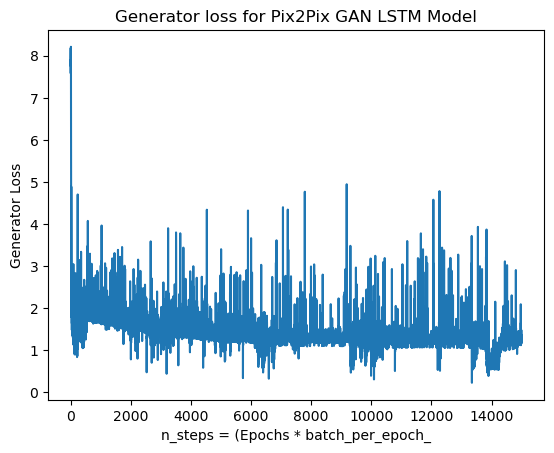

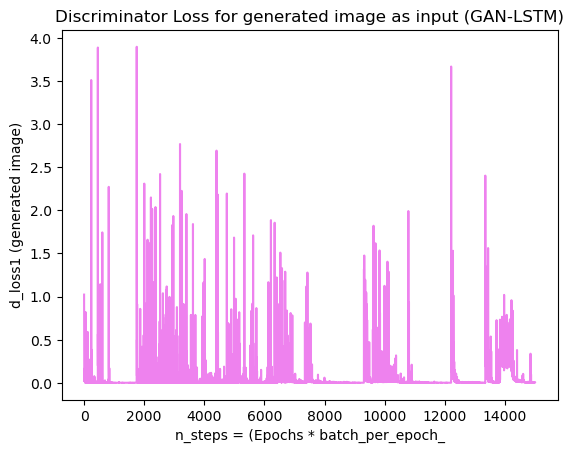

Text(0.5, 1.0, 'Discriminator Loss for real image as input(GAN-LSTM)')

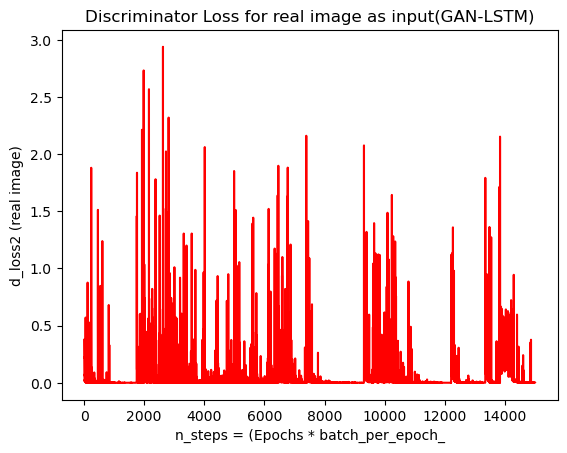

In [72]:
import matplotlib.pyplot as plt
plt.plot(gen_loss)
plt.xlabel("n_steps = (Epochs * batch_per_epoch_)")
plt.ylabel("Generator Loss")
plt.title("Generator loss for Pix2Pix GAN LSTM Model")
#plt.savefig("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix/model_1/gen_loss.png")
plt.show()
plt.plot(disc_loss_gen,'violet')
plt.xlabel("n_steps = (Epochs * batch_per_epoch_)")
plt.ylabel("d_loss1 (generated image)")
plt.title("Discriminator Loss for generated image as input (GAN-LSTM)")
#plt.savefig("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix/model_1/disc_gen_loss.png")
plt.show()
plt.plot(disc_loss_real,'red')
plt.xlabel("n_steps = (Epochs * batch_per_epoch_)")
plt.ylabel("d_loss2 (real image)")
plt.title("Discriminator Loss for real image as input(GAN-LSTM)")
#plt.savefig("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix/model_1/disc_loss_real.png")

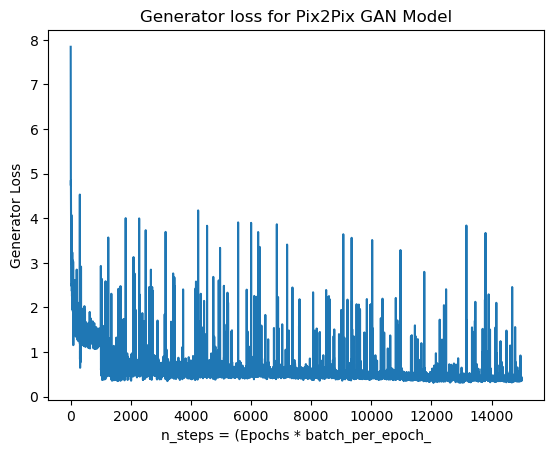

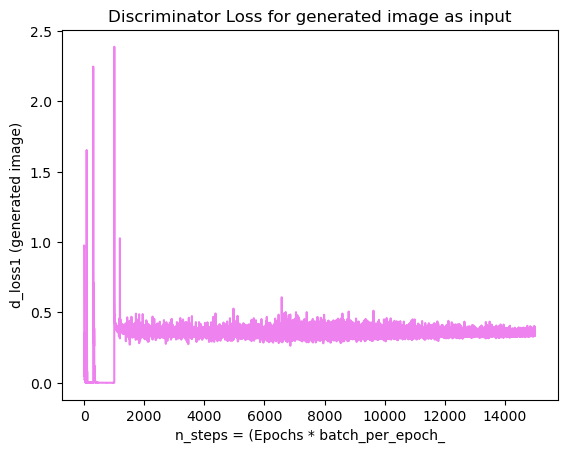

Text(0.5, 1.0, 'Discriminator Loss for real image as input')

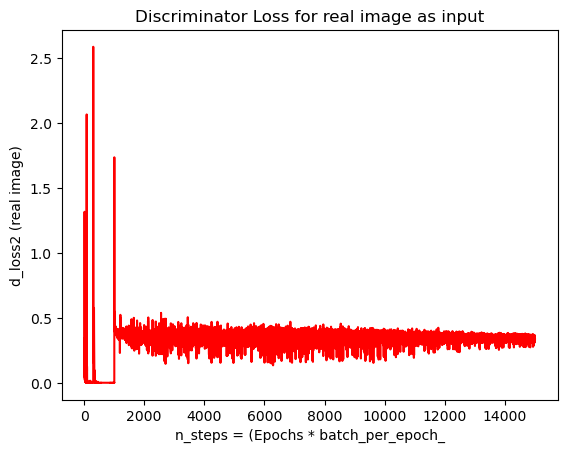

In [28]:
import matplotlib.pyplot as plt
plt.plot(gen_loss)
plt.xlabel("n_steps = (Epochs * batch_per_epoch_")
plt.ylabel("Generator Loss")
plt.title("Generator loss for Pix2Pix GAN Model")
#plt.savefig("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix/model_1/gen_loss.png")
plt.show()
plt.plot(disc_loss_gen,'violet')
plt.xlabel("n_steps = (Epochs * batch_per_epoch_")
plt.ylabel("d_loss1 (generated image)")
plt.title("Discriminator Loss for generated image as input")
#plt.savefig("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix/model_1/disc_gen_loss.png")
plt.show()
plt.plot(disc_loss_real,'red')
plt.xlabel("n_steps = (Epochs * batch_per_epoch_")
plt.ylabel("d_loss2 (real image)")
plt.title("Discriminator Loss for real image as input")
#plt.savefig("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix/model_1/disc_loss_real.png")

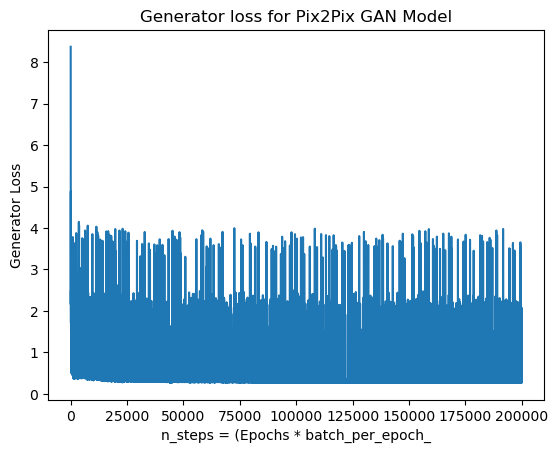

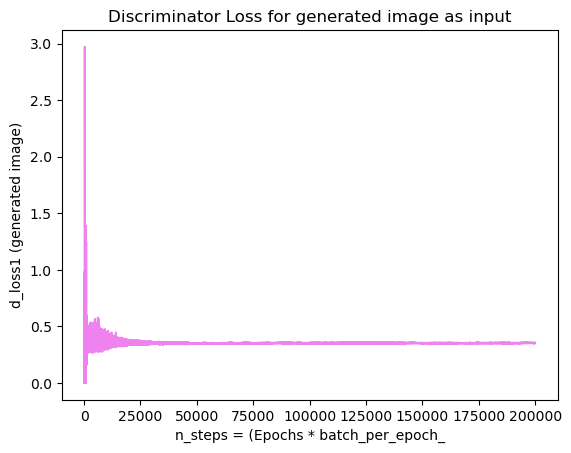

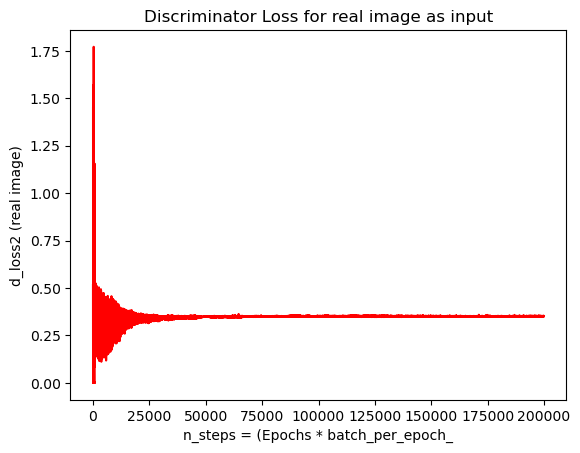

In [95]:
import matplotlib.pyplot as plt
plt.plot(gen_loss)
plt.xlabel("n_steps = (Epochs * batch_per_epoch_")
plt.ylabel("Generator Loss")
plt.title("Generator loss for Pix2Pix GAN Model")
#plt.savefig("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix/model_1/gen_loss.png")
plt.show()
plt.plot(disc_loss_gen,'violet')
plt.xlabel("n_steps = (Epochs * batch_per_epoch_")
plt.ylabel("d_loss1 (generated image)")
plt.title("Discriminator Loss for generated image as input")
#plt.savefig("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix/model_1/disc_gen_loss.png")
plt.show()
plt.plot(disc_loss_real,'red')
plt.xlabel("n_steps = (Epochs * batch_per_epoch_")
plt.ylabel("d_loss2 (real image)")
plt.title("Discriminator Loss for real image as input")
#plt.savefig("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix/model_1/disc_loss_real.png")

In [21]:
# unscaling values
def unscale(mat, VHI_test):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(VHI_test)
  unscaled = scaler.inverse_transform(mat.reshape(192,128))
  return unscaled

In [22]:
def colorcoding(mat):
  for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
      #print(mat[i][j])
      if  mat[i][j] >80:
        mat[i][j] = 255
      # elif (mat[i][j]<80) &(mat[i][j] >70):             # Abnormally Dry
      #   mat[i][j]= 128
      elif (mat[i][j]<80) &(mat[i][j] >60):             # Abnormally Dry
        mat[i][j]= 128
      # elif (mat[i][j]<60) &(mat[i][j] >50):             # Abnormally Dry
      #   mat[i][j]= 64
      elif (mat[i][j]<60) &(mat[i][j] >40):             # Abnormally Dry
        mat[i][j]= 64
      # elif (mat[i][j]<40) &(mat[i][j] >30):             # Abnormally Dry
      #   mat[i][j]= 16
      elif (mat[i][j]<40) &(mat[i][j]>20):              # Moderate drought
        mat[i][j] = 32
      # elif (mat[i][j]<20) & (mat[i][j]>10):             # Severe drought
      #   mat[i][j] = 4
      elif (mat[i][j])<20:                              # Extreme  drought
        mat[i][j]= 0
  return mat

In [32]:
import numpy as np
VHI_test = np.loadtxt("F:\Jyoti Shukla -MS\karnataka dataset\Padded_Test_total_AVHRR_data_1981_2022.txt")
# VHI_train = VHI_train.reshape(2070,192,128)
VHI_test = VHI_test.reshape(53,192,128)
# print("VHI_ train_shape :", VHI_train.shape)
print("\n VHI_test_shape: ", VHI_test.shape)
np.max(VHI_test),np.min(VHI_test)


 VHI_test_shape:  (53, 192, 128)


(100.0, 0.0)

In [49]:
src_image[:,:,:,0].shape

(1, 192, 128)

Loaded (106, 192, 128, 2) (106, 192, 128, 1)
[15]
The generated image array through gan is: 
 [[1.95612032e-02 1.06226970e-02 4.35069390e-02 ... 3.14363308e-04
  2.97566410e-04 4.30694735e-03]
 [2.39950808e-04 1.07662901e-02 1.62390042e-02 ... 1.46892649e-04
  2.60292611e-04 1.00193094e-04]
 [6.47029316e-04 1.64238084e-02 4.33567502e-02 ... 1.35612179e-04
  5.87199000e-04 3.72941402e-04]
 ...
 [1.24918250e-02 7.30907079e-04 4.54276189e-04 ... 1.38373525e-06
  1.87162186e-07 1.52429777e-06]
 [1.05541514e-03 1.14710152e-03 2.24357028e-03 ... 1.03386121e-07
  3.98833890e-08 6.88443265e-07]
 [6.33739517e-04 8.31991900e-03 1.41366925e-02 ... 5.24908671e-07
  4.58658576e-07 1.38508904e-05]]

 The expected output was: 
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


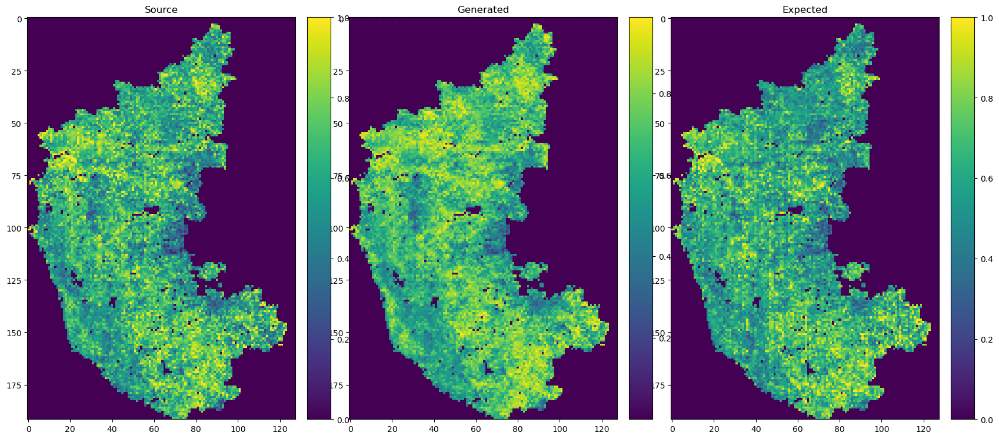


 Unique values of image under test:
 [  0.  32.  64.  80. 128. 255.]
 Unique values of predicted image:
 [  0.  32.  64. 128. 255.] 


 After color-coding the output looks like:



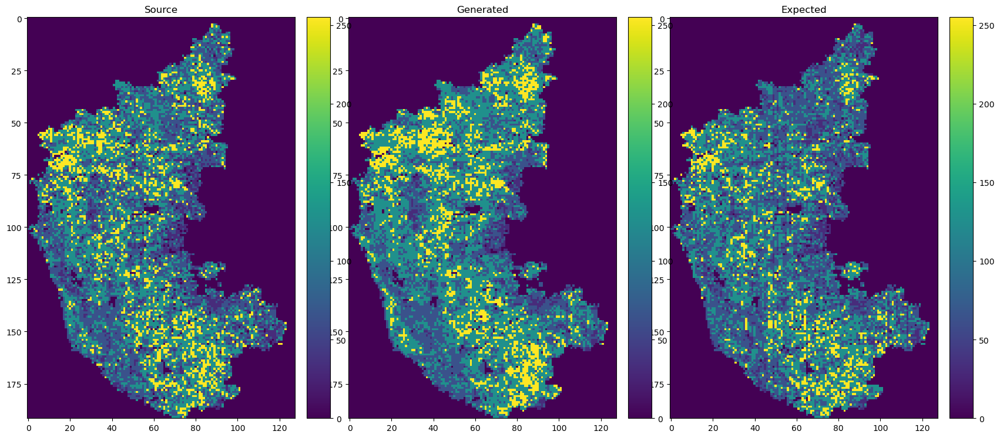

In [34]:
# example of loading a pix2pix model and using it for image to image translation
from keras.models import load_model
from numpy import load
from numpy import vstack
import matplotlib.pyplot as plt
from matplotlib import pyplot
from numpy.random import randint
from sklearn.preprocessing import MinMaxScaler
 
# load and prepare training images
def load_real_samples(filename):
	# load compressed arrays
	data = load(filename)
	# unpack arrays
	X1, X2 = data['x'], data['y']
	# scale from [0,255] to [-1,1]
	# X1 = (X1 - 127.5) / 127.5
	# X2 = (X2 - 127.5) / 127.5
	return [X1, X2]

#plot source, generated and target images

# def plot_images(src_img, gen_img, tar_img):
#   images = vstack((src_img,gen_img, tar_img))
#   #scale from [-1,1] to [0,1]
#   #images = (images +1)/2.0
#   titles = ['Source','Generated','Expected']
#   #plot images row by
#   # matplotlib.image.imsave("Generated_img.jpg",images[1])
#   # matplotlib.image.imsave("Target_img.jpg",images[2])
#   for i in range(len(images)):
#     #define subplot
#     pyplot.subplot(1,3,1+i)
#     #turn off acis
#     pyplot.axis('off')
#     #plot raw pixel data
#     pyplot.imshow(images[i].reshape(512,512))
#     #show title
#     pyplot.title(titles[i])
#   pyplot.show()
# plot source, generated and target images

def plot_images(src_img, gen_img, tar_img):
  #images = [src_img,gen_img, tar_img]
  images = vstack((src_img,gen_img, tar_img))
  #scale from [-1,1] to [0,1]
  #images = (images +1)/2.0
  titles = ['Source','Generated','Expected']
  #plot images row by
  # matplotlib.image.imsave("Generated_img.jpg",images[1])
  # matplotlib.image.imsave("Target_img.jpg",images[2])
  f, axarr = plt.subplots(1,3, figsize=(20,20))
  for i in range(len(images)):
    #define subplot
    pos = axarr[i].imshow(images[i].reshape(192,128), interpolation = 'None')
    cax = f.add_axes([axarr[i].get_position().x1+0.01,axarr[i].get_position().y0,0.02,axarr[i].get_position().height])
    f.colorbar(pos, ax = axarr[i], cax =cax)
    # pyplot.subplot(1,3,1+i)
    # #turn off acis
    # pyplot.axis('off')
    # #plot raw pixel data
    # pyplot.imshow(images[i].reshape(512,512))
    # #show title
    axarr[i].set_title(titles[i])
  pyplot.show()

 
# load dataset
#[X1, X2] = load_real_samples('/content/drive/MyDrive/Drought_Dataset/AVHRR data/paired_padded_arrays_test_AVHRR_data.npz')
[X1, X2] = load_real_samples('F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite\paired_arrays_test_total_rf_vhi_data.npz')
print('Loaded', X1.shape, X2.shape)
# load model
#model = load_model('/content/drive/MyDrive/Drought_Dataset/AVHRR data/Output_plots_model_2/model_030000.h5')
model = load_model('F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\gan_lstm_rf_vhi\model_2_bcdunet\model_031000.h5')
# opt = Adam(learning_rate=0.0002, beta_1=0.5)
# model.compile(loss=['binary_crossentropy', 'mse'], optimizer=opt, loss_weights=[1,100])
# select random example
ix = randint(0, len(VHI_test), 1)
print(ix)
#ix = np.asarray([17])
src_image, tar_image = X1[ix], X2[ix]

# generate image from source
gen_image = model.predict(src_image)
generated = unscale(gen_image,VHI_test[int(ix)+1])
print("The generated image array through gan is: \n", generated)
expected = unscale(X2[ix],VHI_test[int(ix)+1])
print("\n The expected output was: \n",expected)
# plot all three images
plot_images(src_image[:,:,:,0].reshape(1,192,128,1), gen_image, tar_image)
source = unscale(src_image[:,:,:,0].reshape(1,192,128,1), VHI_test[int(ix)])
# apply colorcoding
source = colorcoding(source)
test_im = colorcoding(expected)
pred_im = colorcoding(generated)
print("\n Unique values of image under test:\n",np.unique(test_im))
print(" Unique values of predicted image:\n", np.unique(pred_im),"\n")
print("\n After color-coding the output looks like:\n")
plot_images(source.reshape(1,192,128,1), pred_im.reshape(1,192,128,1), test_im.reshape(1,192,128,1))

In [35]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
pred = generated.reshape(192,128)
y_real = expected.reshape(192,128)
print((pred.reshape(192,128))[70][80],(y_real.reshape(192,128))[70][80])
r2 = r2_score(tar_image.reshape(192,128), gen_image.reshape(192,128))
residual = mse(tar_image.reshape(192,128), gen_image.reshape(192,128))
print(r2,residual)
mse(expected.reshape(192,128), generated.reshape(192,128))

128.0 64.0
0.8711477322842665 0.007967832


1834.7938

In [1]:
import os
path = r"F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/"
dir_list = os.listdir(path)
for file in dir_list:
    if file.endswith(".h5"):
      print(os.path.join(path,file))

F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/model_009995.h5
F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/model_019990.h5
F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/model_029985.h5
F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/model_039980.h5
F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/model_049975.h5
F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/model_059970.h5
F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/model_069965.h5
F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/model_079960.h5
F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/model_089955.h5
F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/model_099950.h5
F:\Jyoti Shukla -MS\codes\Saved_models_a

In [6]:
from posixpath import realpath
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
from keras.models import load_model
from numpy import load
from numpy import vstack
import matplotlib.pyplot as plt
from matplotlib import pyplot
from numpy.random import randint

def load_real_samples(filename):
	# load compressed arrays
	data = load(filename)
	# unpack arrays
	X1, X2 = data['x'], data['y']
	# scale from [0,255] to [-1,1]
	# X1 = (X1 - 127.5) / 127.5
	# X2 = (X2 - 127.5) / 127.5
	return [X1, X2]
#[X1, X2] = load_real_samples('/content/drive/MyDrive/Drought_Dataset/AVHRR data/paired_padded_arrays_test_AVHRR_data.npz')
[X1, X2] = load_real_samples('F:\Jyoti Shukla -MS\karnataka dataset\Satellite Data for composite\paired_arrays_test_total_rf_vhi_data.npz')
print('Loaded', X1.shape, X2.shape)
# load model
#model = load_model('/content/drive/MyDrive/Drought_Dataset/AVHRR data/Output_plots_model_2/model_030000.h5')
for file in dir_list:
    if file.endswith(".h5"):
      model = load_model(os.path.join(path,file))
      prediction = model.predict(X1)
      # original = []
      # predicted = []
      # predicted_unscaled_without_colorcode =[]
      R2_score_avhrr_model_015000 =[]
      mae_avhrr_model_015000=[]
      mse_avhrr_model_015000=[]
      for ix in range(len(X1)):
        # ix = np.asarray([ix])
        src_image, tar_image = X1[ix], X2[ix]
        # # generate image from source
        # gen_image = model.predict(src_image)
        # generated = unscale(gen_image,VHI_test[int(ix)+1])
        #print("The generated image array through gan is: \n", generated)
        # real input
        # real = unscale(X1[ix], VHI_test[int(ix)])
        #plt.imshow(real)
        #expected
        # expected = unscale(X2[ix],VHI_test[int(ix)+1])
        #print("\n The expected output was: \n",expected)
        #generated 
        yreal = tar_image.reshape(192,128)
        pred = prediction[ix].reshape(192,128)
        r2 = r2_score(yreal, pred)
        res = mae(yreal, pred)
        error = mse(yreal, pred)
        # test_gen = colorcoding(generated)
        # test_real = colorcoding(real)
        #plt.imshow(test_gen)
        # plot all three images
        # test_im = colorcoding(expected)
        R2_score_avhrr_model_015000.append(r2)
        mae_avhrr_model_015000.append(res)
        mse_avhrr_model_015000.append(error)
        # predicted_unscaled_without_colorcode.append(pred.reshape(192,128))

      print("For model", file[7:-3], "mean R2 is:", np.mean(R2_score_avhrr_model_015000) )
      print("For model", file[7:-3], "max R2 is:", np.max(R2_score_avhrr_model_015000))
      print("For model", file[7:-3], "mean mse is:", np.mean(mse_avhrr_model_015000))
      print("For model", file[7:-3], "mean mae is:", np.mean(mae_avhrr_model_015000))

Loaded (106, 192, 128, 2) (106, 192, 128, 1)
For model 09995 mean R2 is: 0.9091224003364424
For model 09995 max R2 is: 0.9264981137561075
For model 09995 mean mse is: 0.0055646515
For model 09995 mean mae is: 0.042313352
For model 19990 mean R2 is: 0.9251426697384934
For model 19990 max R2 is: 0.941766795408228
For model 19990 mean mse is: 0.0040585333
For model 19990 mean mae is: 0.035953064
For model 29985 mean R2 is: 0.9309432984638947
For model 29985 max R2 is: 0.9460094860007179
For model 29985 mean mse is: 0.003453003
For model 29985 mean mae is: 0.03307515
For model 39980 mean R2 is: 0.9248190346517576
For model 39980 max R2 is: 0.9406690672591371
For model 39980 mean mse is: 0.0041139736
For model 39980 mean mae is: 0.036004897
For model 49975 mean R2 is: 0.9318726573048093
For model 49975 max R2 is: 0.9483492086331388
For model 49975 mean mse is: 0.003331429
For model 49975 mean mae is: 0.032436438
For model 59970 mean R2 is: 0.9314194522362483
For model 59970 max R2 is: 0.947

In [7]:
model = load_model("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/model_049975.h5")
predicted_gan_lstm_1500 = model.predict(X1)
np.save("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_1/predicted_pix2pix_rf_vhi_complete_Steps_49975.npy", predicted_gan_lstm_1500)

In [16]:
from __future__ import division
from keras.models import Model
from keras.layers import Input, concatenate, Conv2D, MaxPooling2D, UpSampling2D, Reshape, core, Dropout
from tensorflow.keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as K
from keras.utils.vis_utils import plot_model as plot
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import *
from keras.layers import * 
import numpy as np

In [17]:
def define_generator(input_size = (192,128,2)):
    N1 = input_size[0]
    N2 = input_size[1]
    init = RandomNormal(stddev=0.02)
    inputs = Input(input_size) 
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(inputs)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(conv1)
  
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(pool1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(pool2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(conv3)
    drop3 = Dropout(0.5)(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    # D1
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(pool3)     
    conv4_1 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(conv4)
    drop4_1 = Dropout(0.5)(conv4_1)
    # D2
    conv4_2 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(drop4_1)     
    conv4_2 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(conv4_2)
    conv4_2 = Dropout(0.5)(conv4_2)
    # D3
    merge_dense = concatenate([conv4_2,drop4_1], axis = 3)
    conv4_3 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(merge_dense)     
    conv4_3 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(conv4_3)
    drop4_3 = Dropout(0.5)(conv4_3)

    up6 = Conv2DTranspose(256, kernel_size=2, strides=2, padding='same',kernel_initializer = init)(drop4_3)
    up6 = BatchNormalization(axis=3)(up6)
    up6 = Activation('relu')(up6)

    x1 = Reshape(target_shape=(1, np.int32(N1/4), np.int32(N2/4), 256))(drop3)
    x2 = Reshape(target_shape=(1, np.int32(N1/4), np.int32(N2/4), 256))(up6)
    merge6  = concatenate([x1,x2], axis = 1) 
    merge6 = ConvLSTM2D(filters = 128, kernel_size=(3, 3), padding='same', return_sequences = False, go_backwards = True,kernel_initializer = init )(merge6)
            
    conv6 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(merge6)
    conv6 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(conv6)

    up7 = Conv2DTranspose(128, kernel_size=2, strides=2, padding='same',kernel_initializer = init)(conv6)
    up7 = BatchNormalization(axis=3)(up7)
    up7 = Activation('relu')(up7)

    x1 = Reshape(target_shape=(1, np.int32(N1/2), np.int32(N2/2), 128))(conv2)
    x2 = Reshape(target_shape=(1, np.int32(N1/2), np.int32(N2/2), 128))(up7)
    merge7  = concatenate([x1,x2], axis = 1) 
    merge7 = ConvLSTM2D(filters = 64, kernel_size=(3, 3), padding='same', return_sequences = False, go_backwards = True,kernel_initializer = init )(merge7)
        
    conv7 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(merge7)
    conv7 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(conv7)

    up8 = Conv2DTranspose(64, kernel_size=2, strides=2, padding='same',kernel_initializer = init)(conv7)
    up8 = BatchNormalization(axis=3)(up8)
    up8 = Activation('relu')(up8)    

    x1 = Reshape(target_shape=(1, N1, N2, 64))(conv1)
    x2 = Reshape(target_shape=(1, N1, N2, 64))(up8)
    merge8  = concatenate([x1,x2], axis = 1) 
    merge8 = ConvLSTM2D(filters = 32, kernel_size=(3, 3), padding='same', return_sequences = False, go_backwards = True,kernel_initializer = init )(merge8)    
    
    conv8 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(merge8)
    conv8 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(conv8)
    conv8 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = init)(conv8)
    conv9 = Conv2D(1, 1, activation = 'sigmoid')(conv8)

    model = Model(inputs, conv9)
    huber_loss = tf.keras.losses.Huber(delta = 0.5)
    model.compile(optimizer = 'sgd', loss = 'mse', metrics = ['mse'])
    return model

## MLP

In [70]:
# mlp for multi-label classification
from numpy import mean
import numpy as np
from numpy import std
from sklearn.datasets import make_multilabel_classification
from sklearn.model_selection import RepeatedKFold
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

In [71]:
def unscale(mat, VHI_test):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(VHI_test.reshape(192,128))
  unscaled = scaler.inverse_transform(mat.reshape(192,128))
  return unscaled


In [72]:
def colorcoding(mat):
  for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
      #print(mat[i][j])
      if  mat[i][j] >80:
        mat[i][j] = 255
      # elif (mat[i][j]<80) &(mat[i][j] >70):             # Abnormally Dry
      #   mat[i][j]= 128
      elif (mat[i][j]<80) &(mat[i][j] >60):             # Abnormally Dry
        mat[i][j]= 128
      # elif (mat[i][j]<60) &(mat[i][j] >50):             # Abnormally Dry
      #   mat[i][j]= 64
      elif (mat[i][j]<60) &(mat[i][j] >40):             # Abnormally Dry
        mat[i][j]= 64
      # elif (mat[i][j]<40) &(mat[i][j] >30):             # Abnormally Dry
      #   mat[i][j]= 16
      elif (mat[i][j]<40) &(mat[i][j]>20):              # Moderate drought
        mat[i][j] = 32
      # elif (mat[i][j]<20) & (mat[i][j]>10):             # Severe drought
      #   mat[i][j] = 4
      elif (mat[i][j])<20:                              # Extreme  drought
        mat[i][j]= 0
  return mat

In [73]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout

# Parameters
batch_size = 4 # It is the sample size of inputs to be processed at each training stage. 
hidden_units = 8
dropout = 0.2
input_size = 49152

# Nossa  MLP com ReLU e Dropout 
model = Sequential()

model.add(Dense(hidden_units, input_dim=input_size))
model.add(Activation('relu'))
model.add(Dropout(dropout))

model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dropout(dropout))

# model.add(Dense(1024))
# model.add(Activation('relu'))
# model.add(Dropout(dropout))

# model.add(Dense(512))
# model.add(Activation('relu'))
# model.add(Dropout(dropout))

model.add(Dense(24576))
model.add(Activation('sigmoid'))
model.summary()
model.compile(loss='mae', optimizer='sgd', metrics=['mse'])

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_29 (Dense)             (None, 8)                 393224    
_________________________________________________________________
activation_28 (Activation)   (None, 8)                 0         
_________________________________________________________________
dropout_22 (Dropout)         (None, 8)                 0         
_________________________________________________________________
dense_30 (Dense)             (None, 512)               4608      
_________________________________________________________________
activation_29 (Activation)   (None, 512)               0         
_________________________________________________________________
dropout_23 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_31 (Dense)             (None, 24576)            

In [75]:
history = model.fit(X_train_flattened, y_train_flattened, epochs=30, batch_size=batch_size)

InternalError: Failed copying input tensor from /job:localhost/replica:0/task:0/device:CPU:0 to /job:localhost/replica:0/task:0/device:GPU:0 in order to run _EagerConst: Dst tensor is not initialized.

## *KNN*

In [19]:
from sklearn.multioutput import RegressorChain
from sklearn.neighbors import KNeighborsRegressor
model_KNN = KNeighborsRegressor()
model_KNN.fit(X_train_flattened,y_train_flattened)

KNeighborsRegressor()

In [21]:
predicted_KNN = model_KNN.predict(X_test_flattened.reshape(106,49152))
predicted_KNN = predicted_KNN.reshape(106,192,128)
print(predicted_KNN.shape)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/predicted_output_KNN_rf_vhi.npy", predicted_KNN)

(106, 192, 128)


0.020795401 0.759037596391563


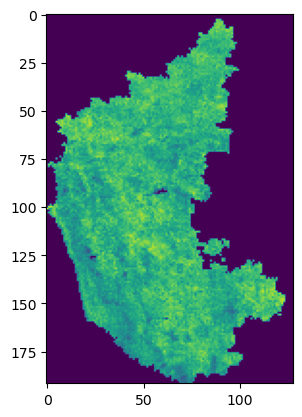

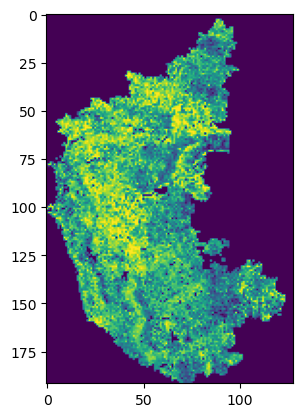

In [22]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
predicted_KNN = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/predicted_output_KNN_rf_vhi.npy")
pred = predicted_KNN[0].reshape(192,128)
yreal = y_test[0].reshape(192,128)
r2 = r2_score(yreal,pred)
error = mse(yreal,pred)
print(error,r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

Text(0.5, 0.98, 'KNN Outputs')

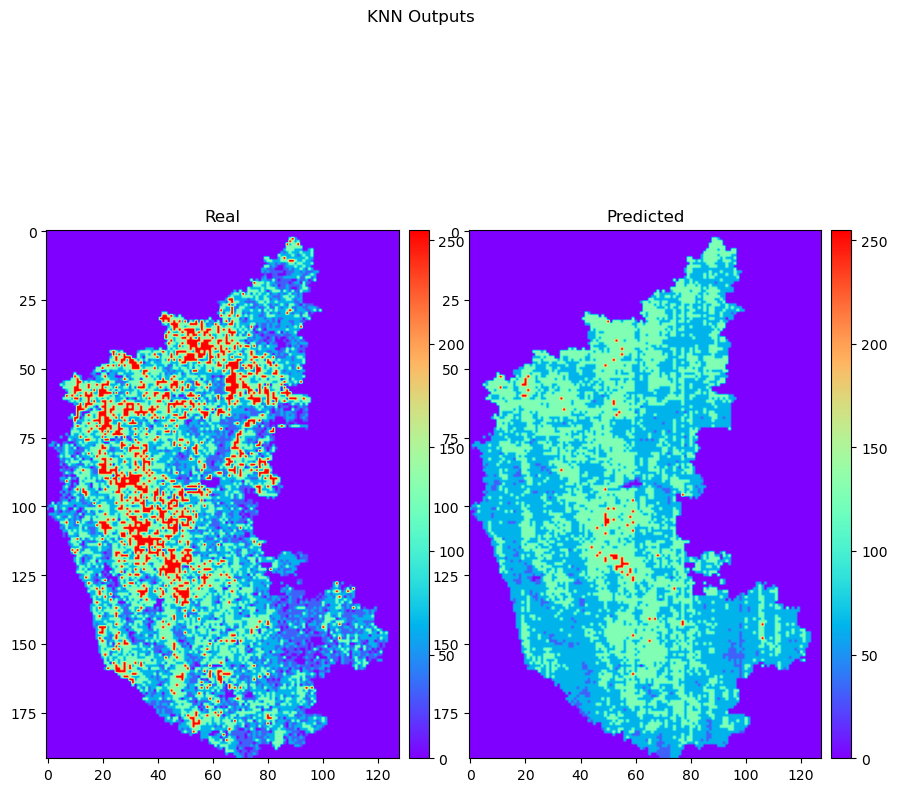

In [46]:
unscale_pred = unscale(pred,ytest[1])
unscale_real = unscale(yreal,ytest[1])
colorcoded_pred = colorcoding(unscale_pred)
colorcoded_real = colorcoding(unscale_real)
images = [colorcoded_real, colorcoded_pred]
titles =["Real","Predicted"]
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
for i in range(len(images)):
    pos = ax[i].imshow(images[i].reshape(192,128), cmap="rainbow")
    #ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax[i].get_position().x1+0.01,ax[i].get_position().y0,0.02,ax[i].get_position().height])
    fig.colorbar(pos, ax = ax[i], cax =cax)
    ax[i].set_title(titles[i])
    #ax.axis("off")
fig.suptitle("KNN Outputs")

In [47]:
R2_KNN =[]
error_KNN =[]
yhat_KNN =[]
MSE_KNN = []
for i in range(len(X_test_flattened)):
    pred = predicted_KNN[i].reshape(192,128)
    yreal = y_test_flattened[i].reshape(192,128)
    r2 = r2_score(yreal,pred)
    err = mae(yreal,pred)
    mse_err = mse(yreal,pred)
    yhat_KNN.append(pred)
    R2_KNN.append(r2)
    error_KNN.append(err)
    MSE_KNN.append(mse_err)
print(R2_KNN)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_KNN_total.npy",R2_KNN)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_for_KNN_total.npy",error_KNN)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\MSE_for_KNN_total.npy",MSE_KNN)

[0.759037596391563, 0.9507574044651512, 0.8738538114749559, 0.9247550326912781, 0.8947427968263901, 0.8584516969800093, 0.8664218158180215, 0.861965975263467, 0.814754215094873, 0.8968239644112044, 0.8509637537633938, 0.8543746695929384, 0.8533458459979415, 0.8069489785750056, 0.8162673932448894, 0.8425514902931446, 0.8432839124080664, 0.815375735710443, 0.8656255456288617, 0.846277530854178, 0.7761283364749423, 0.8361212353915064, 0.8623628436760299, 0.8582853068846246, 0.8614627351600923, 0.8133432671099483, 0.8360603823573713, 0.8675557243548521, 0.8600895462619769, 0.901681874309748, 0.8882072861584243, 0.9000887166535574, 0.912908863710019, 0.9226319713346154, 0.9373754563195555, 0.872870091432765, 0.9328646933122855, 0.8988869742421342, 0.9199139788075066, 0.9124153949522629, 0.9335381689072706, 0.9375930868175202, 0.9003973091150518, 0.9171116615949455, 0.8853428917320749, 0.9238062238997747, 0.901579164600058, 0.8847403317285216, 0.8453091251612426, 0.8521621664073107, 0.841179

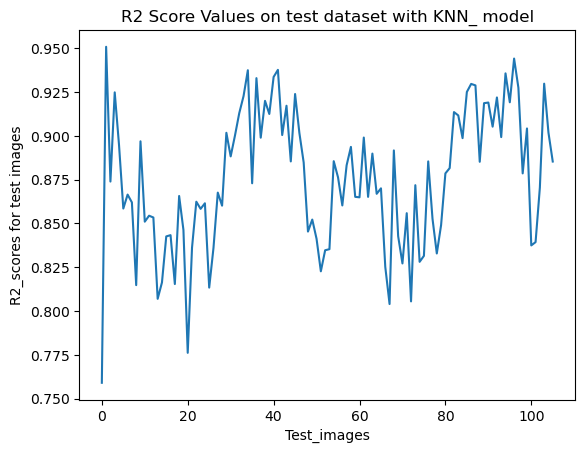

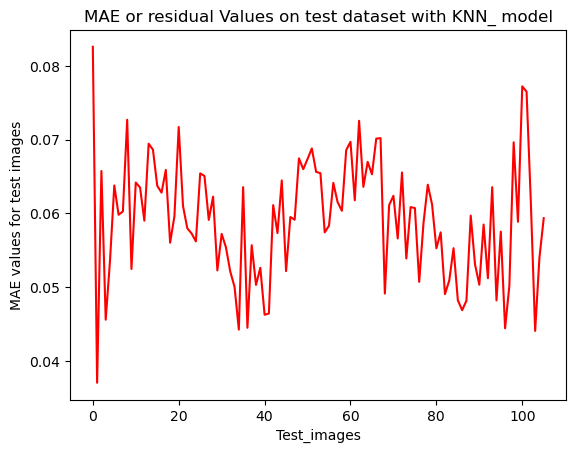

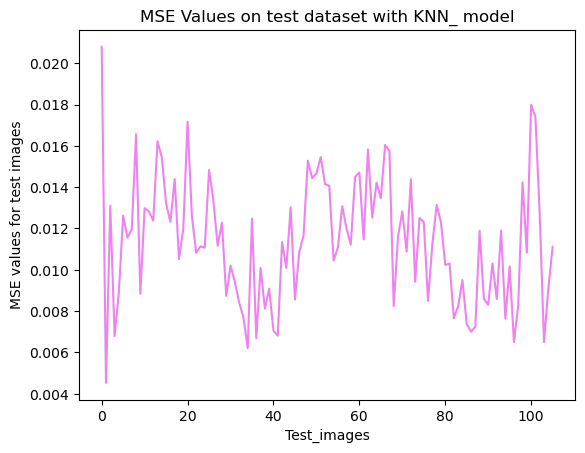

In [48]:
R2_KNN_ = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\R2_score_KNN_total.npy")
error_KNN_ = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\MAE_for_KNN_total.npy")
MSE_KNN_ = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\MSE_for_KNN_total.npy")
plt.plot(R2_KNN_)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with KNN_ model")
plt.show()
plt.plot(error_KNN_,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with KNN_ model")
plt.show()
plt.plot(MSE_KNN_, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with KNN_ model")
plt.show()

In [49]:
np.max(R2_KNN), np.mean(R2_KNN), np.mean(MSE_KNN), np.mean(error_KNN)

(0.9507574044651512, 0.8754182767285006, 0.011415889, 0.059169568)

## *DT Regressor*

In [52]:
from sklearn.tree import DecisionTreeRegressor
model_DT = DecisionTreeRegressor()
model_DT.fit(X_train_flattened,y_train_flattened)

DecisionTreeRegressor()

In [54]:
predicted_DT = model_DT.predict(X_test_flattened.reshape(106,49152))
predicted_DT = predicted_DT.reshape(106,192,128)
print(predicted_DT.shape)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\Predicted_outputs_DT_rf_vhi.npy",predicted_DT)

(106, 192, 128)


0.10761476425817781 0.5647677442683092


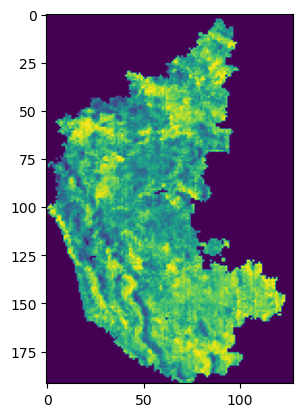

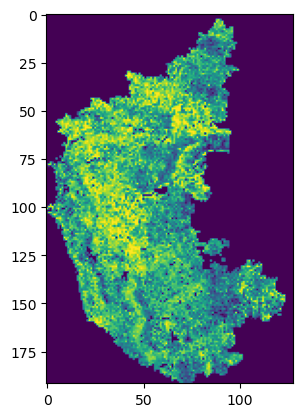

In [56]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
predicted_DT = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\Predicted_outputs_DT_rf_vhi.npy")
pred = predicted_DT[0].reshape(192,128)
yreal = y_test_flattened[0].reshape(192,128)
r2 = r2_score(yreal,pred)
error = mae(yreal,pred)
print(error,r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

Text(0.5, 0.98, 'DT Outputs')

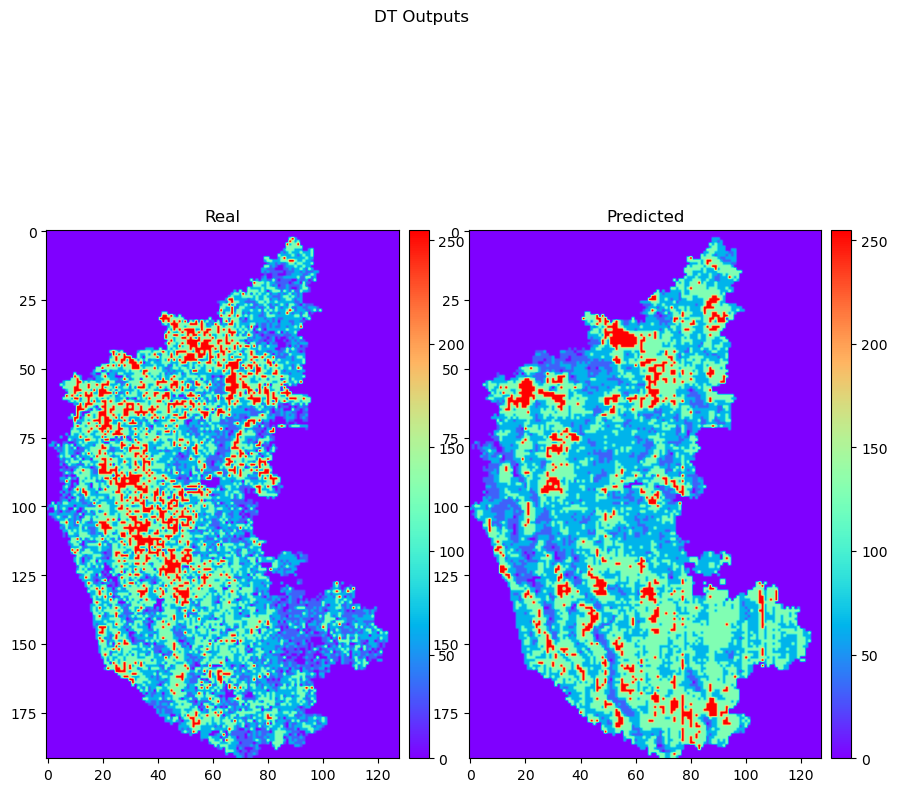

In [57]:
unscale_pred = unscale(pred,ytest[1])
unscale_real = unscale(yreal,ytest[1])
colorcoded_pred = colorcoding(unscale_pred)
colorcoded_real = colorcoding(unscale_real)
images = [colorcoded_real, colorcoded_pred]
titles =["Real","Predicted"]
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
for i in range(len(images)):
    pos = ax[i].imshow(images[i].reshape(192,128), cmap="rainbow")
    #ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax[i].get_position().x1+0.01,ax[i].get_position().y0,0.02,ax[i].get_position().height])
    fig.colorbar(pos, ax = ax[i], cax =cax)
    ax[i].set_title(titles[i])
    #ax.axis("off")
fig.suptitle("DT Outputs")

In [59]:
R2_DT =[]
error_DT =[]
yhat_DT =[]
MSE_DT = []
for i in range(len(X_test_flattened)):
    pred = predicted_DT[i].reshape(192,128)
    yreal = y_test_flattened[i].reshape(192,128)
    r2 = r2_score(yreal,pred)
    err = mae(yreal,pred)
    mse_err = mse(yreal,pred)
    yhat_DT.append(pred)
    R2_DT.append(r2)
    error_DT.append(err)
    MSE_DT.append(mse_err)
print(R2_DT)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_DT_rf_vhi.npy",R2_DT)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_for_DT_rf_vhi.npy",error_DT)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\MSE_for_DT_rf_vhi.npy",MSE_DT)

[0.5647677442683092, 0.5739403747009089, 0.6313761821562084, 0.6194629532999426, 0.6903158285003098, 0.5199544782817678, 0.7953058628534404, 0.7029472540357302, 0.7247024171594776, 0.7387367809689471, 0.8621023426965428, 0.8719276736659083, 0.7961284844908425, 0.812800696415785, 0.7451828915343024, 0.6788076412302966, 0.6725372400532199, 0.6076389287183135, 0.7882903957567144, 0.8129005037164894, 0.7605564420860416, 0.768049938956606, 0.8241418073717403, 0.8155418312974121, 0.809545038474867, 0.8478366622140721, 0.8178650216519622, 0.7350797424599437, 0.7267429772262437, 0.8062822960148529, 0.8605602524640564, 0.9277005986765425, 0.9156254108061075, 0.9232840651659591, 0.7705128024366136, 0.7731635528251504, 0.8706898501839183, 0.8577506155452093, 0.8518315360000986, 0.8770496884702366, 0.8725735229977575, 0.6866699289555791, 0.6734889741376939, 0.6437108679704551, 0.665935116874011, 0.7898219415384911, 0.6130816361090998, 0.6254887632004071, 0.6252878514735702, 0.5252097513467507, 0.5

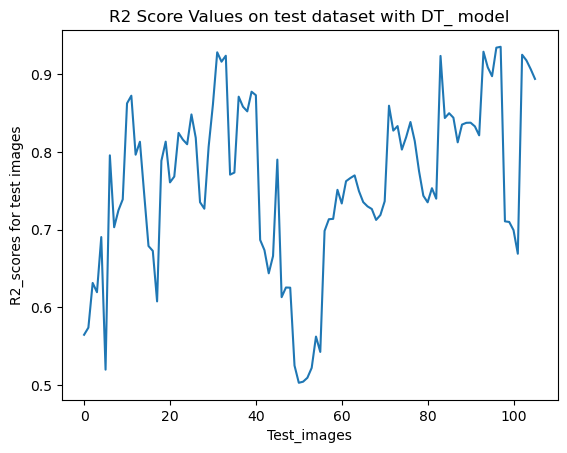

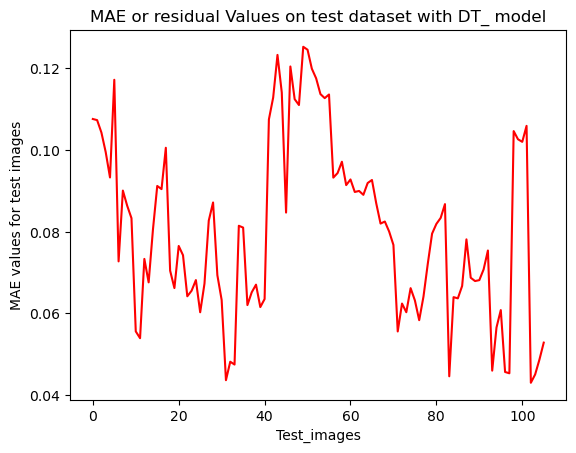

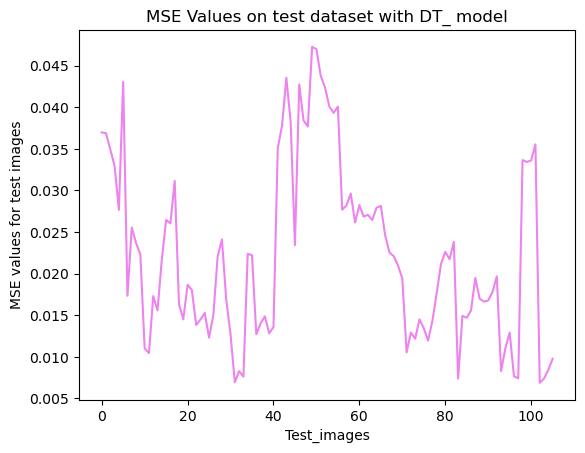

In [60]:
R2_DT_ = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\R2_score_DT_rf_vhi.npy")
error_DT_ = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\MAE_for_DT_rf_vhi.npy")
MSE_DT_ = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\MSE_for_DT_rf_vhi.npy")
plt.plot(R2_DT_)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with DT_ model")
plt.show()
plt.plot(error_DT_,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with DT_ model")
plt.show()
plt.plot(MSE_DT_, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with DT_ model")
plt.show()

In [61]:
np.max(R2_DT), np.mean(R2_DT), np.mean(MSE_DT), np.mean(error_DT)

(0.9347886219268282,
 0.7607105959584437,
 0.022313343060693772,
 0.08033537782551849)

## XGBoost

In [32]:
import xgboost as xg
xgbr = xg.XGBRegressor(max_depth =2, booster = 'gbtree', objective = 'reg:squarederror', n_estimators =2, n_jobs=-1, random_state=0, verbosity=1)
xgbr.fit(X_train_flattened, y_train_flattened)

XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=2, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=2, n_jobs=-1, num_parallel_tree=None, predictor=None,
             random_state=0, ...)

In [33]:
predicted_xgb = xgbr.predict(X_test_flattened.reshape(106,49152))
predicted_xgb = predicted_xgb.reshape(106,192,128)
print(predicted_xgb.shape)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\Predicted_outputs_xgb_rf_vhi.npy",predicted_xgb)

(106, 192, 128)


0.18167144 0.2043172520344347


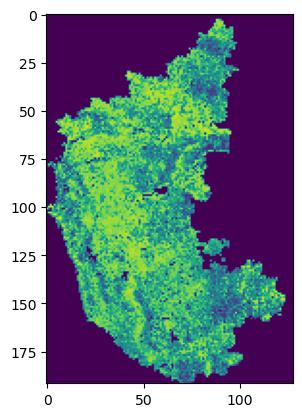

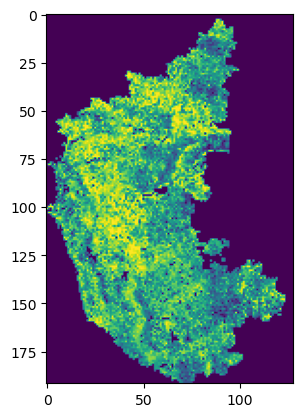

In [34]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
predicted_xgb = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\Predicted_outputs_xgb_rf_vhi.npy")
pred = predicted_xgb[0].reshape(192,128)
yreal = y_test_flattened[0].reshape(192,128)
r2 = r2_score(yreal,pred)
error = mae(yreal,pred)
print(error,r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

Text(0.5, 0.98, 'DT Outputs')

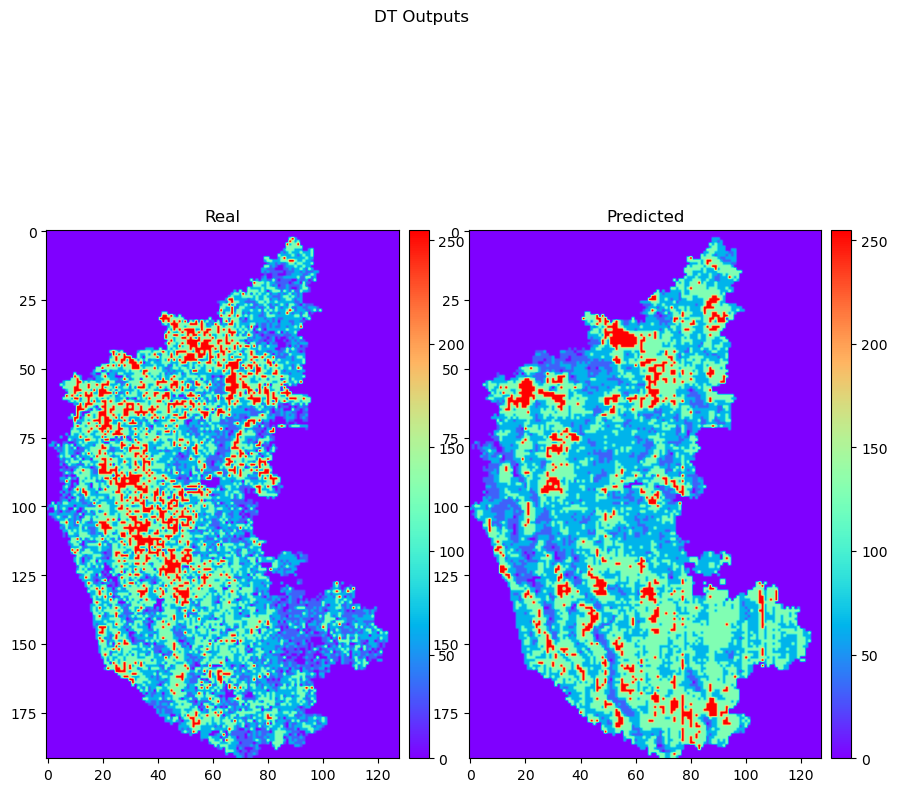

In [ ]:
unscale_pred = unscale(pred,ytest[1])
unscale_real = unscale(yreal,ytest[1])
colorcoded_pred = colorcoding(unscale_pred)
colorcoded_real = colorcoding(unscale_real)
images = [colorcoded_real, colorcoded_pred]
titles =["Real","Predicted"]
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
for i in range(len(images)):
    pos = ax[i].imshow(images[i].reshape(192,128), cmap="rainbow")
    #ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax[i].get_position().x1+0.01,ax[i].get_position().y0,0.02,ax[i].get_position().height])
    fig.colorbar(pos, ax = ax[i], cax =cax)
    ax[i].set_title(titles[i])
    #ax.axis("off")
fig.suptitle("DT Outputs")

In [35]:
R2_xgb =[]
error_xgb =[]
yhat_xgb =[]
MSE_xgb = []
for i in range(len(X_test_flattened)):
    pred = predicted_xgb[i].reshape(192,128)
    yreal = y_test_flattened[i].reshape(192,128)
    r2 = r2_score(yreal,pred)
    err = mae(yreal,pred)
    mse_err = mse(yreal,pred)
    yhat_xgb.append(pred)
    R2_xgb.append(r2)
    error_xgb.append(err)
    MSE_xgb.append(mse_err)
print(R2_xgb)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_xgb_rf_vhi.npy",R2_xgb)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_for_xgb_rf_vhi.npy",error_xgb)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\MSE_for_xgb_rf_vhi.npy",MSE_xgb)

[0.2043172520344347, 0.20310587508181385, 0.1999822011901848, 0.2199626066576188, 0.22200648558406913, 0.21121718476606033, 0.21493981532858314, 0.22122924796711493, 0.23439290057439088, 0.24439203478140056, 0.2524080592500852, 0.264675948206651, 0.2801088426145645, 0.28301023251647894, 0.2795114481446136, 0.30362708911929437, 0.31201074363237835, 0.31285013393525557, 0.32190314900844763, 0.312551756408628, 0.30724821994794155, 0.3080473222325161, 0.29364862375404116, 0.31372293272231944, 0.3076082119984722, 0.30343930620569826, 0.2999854441459948, 0.2977686168030796, 0.28880791372771286, 0.29550874624689183, 0.28233345521537995, 0.27839144325056775, 0.2686134047056444, 0.27503849256833435, 0.2882806533080278, 0.2924830997270951, 0.29960974790881784, 0.3088531271061351, 0.3143787245897879, 0.3075144830411977, 0.31197446557346276, 0.3246961227442133, 0.31480624728190204, 0.3176807204999686, 0.3223557387348843, 0.32624945833543884, 0.3260778177262613, 0.3226999252599275, 0.29807553003100

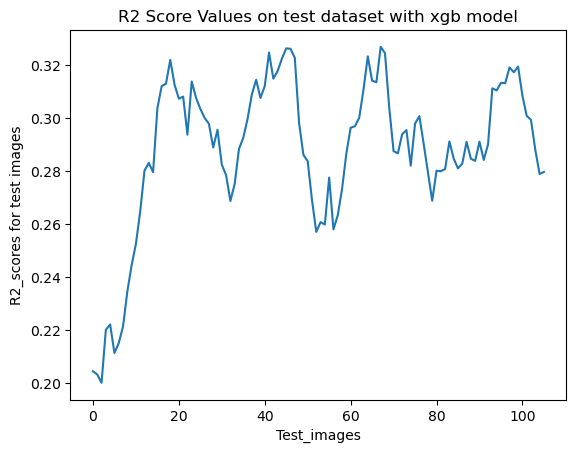

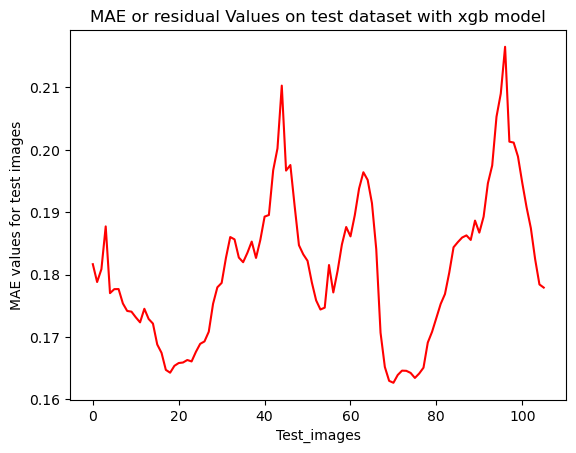

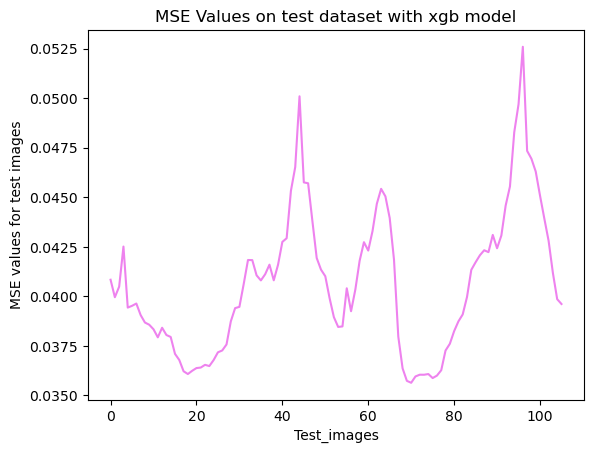

In [36]:
R2_xgb = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\R2_score_xgb_rf_vhi.npy")
error_xgb = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\MAE_for_xgb_rf_vhi.npy")
MSE_xgb = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\MSE_for_xgb_rf_vhi.npy")
plt.plot(R2_xgb)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with xgb model")
plt.show()
plt.plot(error_xgb,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with xgb model")
plt.show()
plt.plot(MSE_xgb, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with xgb model")
plt.show()

In [37]:
np.max(R2_xgb), np.mean(R2_xgb), np.mean(MSE_xgb), np.mean(error_xgb)

(0.3268426607177576, 0.2879519626667063, 0.040655375, 0.18083274)

## Random Forest

In [38]:
from sklearn.ensemble import RandomForestRegressor

# define used regressor
forest=RandomForestRegressor(n_estimators=3,max_depth=2, verbose=2, n_jobs=-1)

# train model
forest.fit(X_train_flattened, y_train_flattened)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


building tree 1 of 3
building tree 2 of 3
building tree 3 of 3


[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed: 58.2min finished


RandomForestRegressor(max_depth=2, n_estimators=3, n_jobs=-1, verbose=2)

In [39]:
predicted_RF =forest.predict(X_test_flattened.reshape(106,49152))
predicted_RF = predicted_RF.reshape(106,192,128)
print(predicted_RF.shape)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\Predicted_outputs_RF_rf_vhi.npy",predicted_RF)

[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   3 out of   3 | elapsed:    0.0s finished


(106, 192, 128)


0.09015614437358785 0.7443150920535773


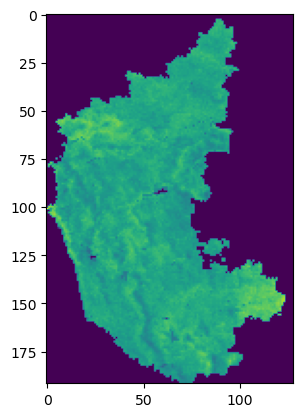

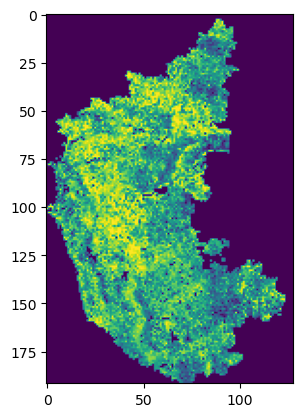

In [11]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
predicted_RF = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\Predicted_outputs_RF_rf_vhi.npy")
pred = predicted_RF[0].reshape(192,128)
yreal = y_test_flattened[0].reshape(192,128)
r2 = r2_score(yreal,pred)
error = mae(yreal,pred)
print(error,r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

Text(0.5, 0.98, 'DT Outputs')

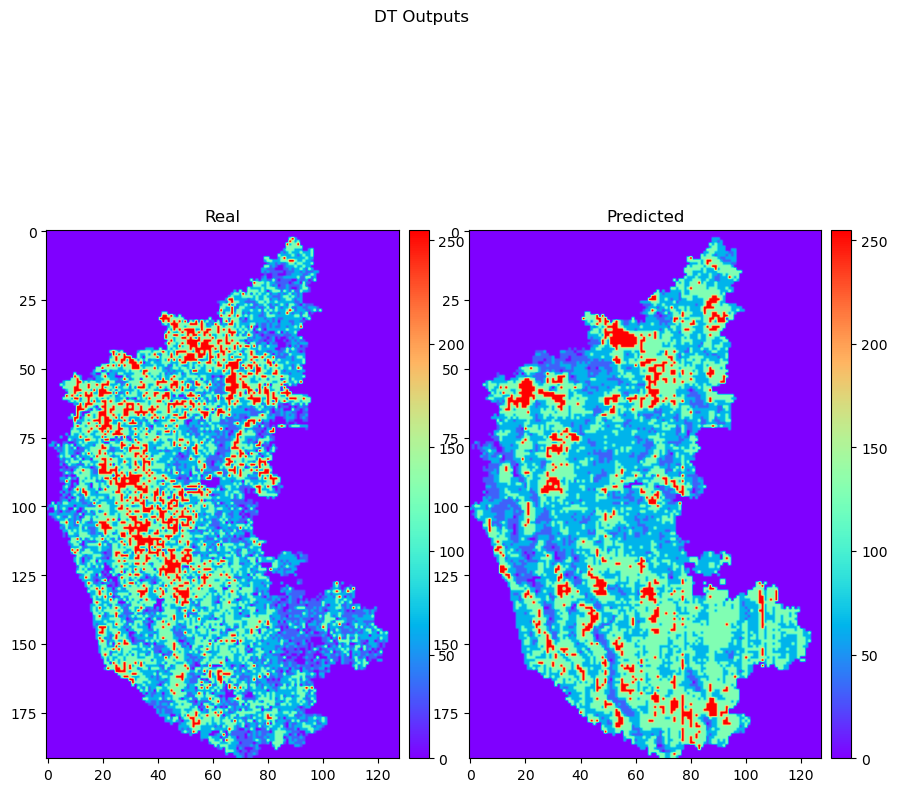

In [ ]:
unscale_pred = unscale(pred,ytest[1])
unscale_real = unscale(yreal,ytest[1])
colorcoded_pred = colorcoding(unscale_pred)
colorcoded_real = colorcoding(unscale_real)
images = [colorcoded_real, colorcoded_pred]
titles =["Real","Predicted"]
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
for i in range(len(images)):
    pos = ax[i].imshow(images[i].reshape(192,128), cmap="rainbow")
    #ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax[i].get_position().x1+0.01,ax[i].get_position().y0,0.02,ax[i].get_position().height])
    fig.colorbar(pos, ax = ax[i], cax =cax)
    ax[i].set_title(titles[i])
    #ax.axis("off")
fig.suptitle("DT Outputs")

In [12]:
R2_RF =[]
error_RF =[]
yhat_RF =[]
MSE_RF = []
for i in range(len(X_test_flattened)):
    pred = predicted_RF[i].reshape(192,128)
    yreal = y_test_flattened[i].reshape(192,128)
    r2 = r2_score(yreal,pred)
    err = mae(yreal,pred)
    mse_err = mse(yreal,pred)
    yhat_RF.append(pred)
    R2_RF.append(r2)
    error_RF.append(err)
    MSE_RF.append(mse_err)
print(R2_RF)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_RF_rf_vhi.npy",R2_RF)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_for_RF_rf_vhi.npy",error_RF)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\MSE_for_RF_rf_vhi.npy",MSE_RF)

[0.7443150920535773, 0.7568404153186599, 0.7601343559601972, 0.7636235287117994, 0.7759305410884334, 0.7759084392073803, 0.7771956728467235, 0.7835265995808527, 0.795115577321986, 0.8042800553184357, 0.807254805539394, 0.8102959861045996, 0.8080626245198934, 0.8231152095385554, 0.8256184592558409, 0.8304852213584888, 0.8419555529901017, 0.8423089878317565, 0.8431861529292237, 0.8468072838184072, 0.8480404092877489, 0.8476163404101669, 0.8474133489519683, 0.8522088274872146, 0.8520716958128002, 0.8448802934765786, 0.8348685162277651, 0.8283847160443684, 0.8202323414607852, 0.8128018088674109, 0.8005688042219729, 0.7887649555417214, 0.7826154680402571, 0.7750935187750703, 0.7838966189666181, 0.7906209790106122, 0.7904406457185238, 0.7889341554022764, 0.7810548506423036, 0.7441750786890243, 0.7690929665210222, 0.7886826940626288, 0.757065366960495, 0.7728896855952524, 0.7254684294406545, 0.7760196049693714, 0.7792644258638635, 0.7854481157125999, 0.7809188674800711, 0.7712370531522647, 0.

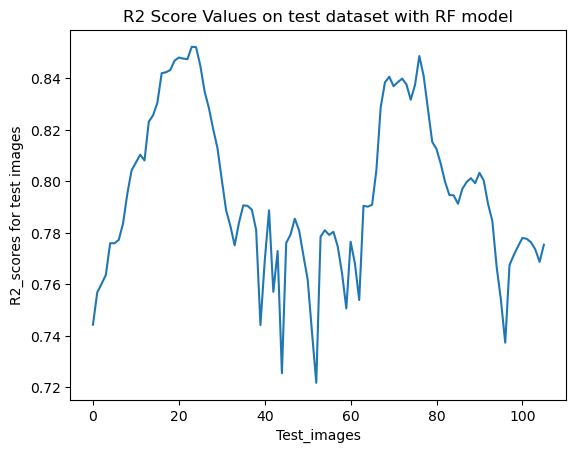

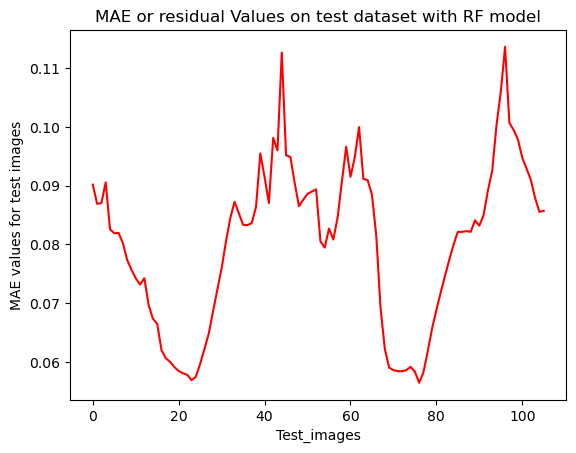

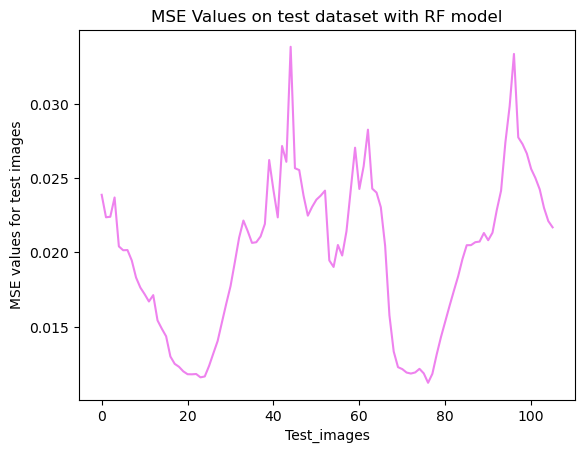

In [13]:
R2_RF = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\R2_score_RF_rf_vhi.npy")
error_RF = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\MAE_for_RF_rf_vhi.npy")
MSE_RF = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\MSE_for_RF_rf_vhi.npy")
plt.plot(R2_RF)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with RF model")
plt.show()
plt.plot(error_RF,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with RF model")
plt.show()
plt.plot(MSE_RF, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with RF model")
plt.show()

In [14]:
np.max(R2_RF), np.mean(R2_RF), np.mean(MSE_RF), np.mean(error_RF)

(0.8522088274872146,
 0.7953165541922043,
 0.019821191887311424,
 0.07999990198664798)

# Ensemble Method

In [43]:
DT_predicted = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\Predicted_outputs_DT_rf_vhi.npy")
#DT_predicted = DT_predicted[:-3]
DT_predicted.shape

(106, 192, 128)

In [19]:
ConvLSTM_predicted = np.load("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Saved_models_and_model_history_rf_vhi\predicted_test_convlstm_9.npy")
ConvLSTM_predicted.shape

(103, 192, 128)

In [65]:
DT_predicted_sub = DT_predicted[:-3]
ensemble_ConvLSTM_DT = (DT_predicted_sub+ConvLSTM_predicted)/2
ensemble_ConvLSTM_DT.shape

(103, 192, 128)

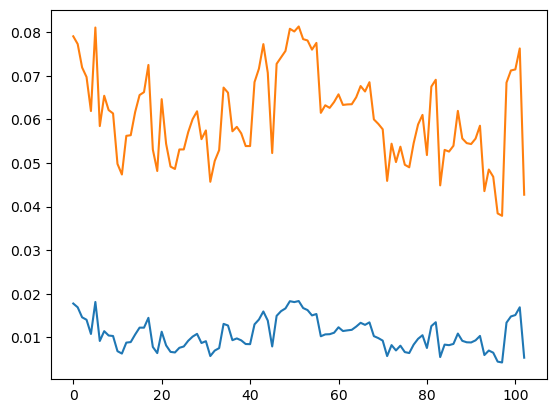

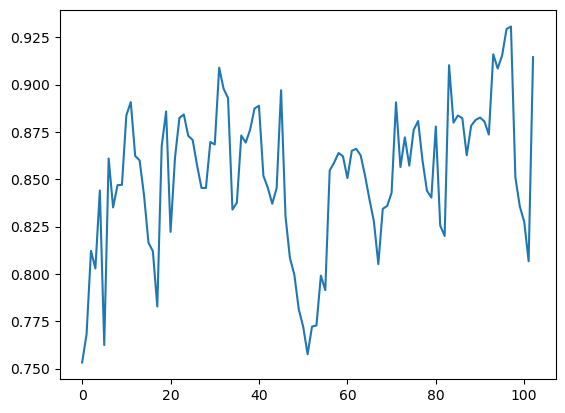

In [66]:
MSE_ConvLSTM_DT =[]
R2_ConvLSTM_DT = []
MAE_ConvLSTM_DT =[]
preds = []
for i in range(len(X_test_flattened)-3):
    pred = ensemble_ConvLSTM_DT[i].reshape(192,128)
    yreal = y_test_flattened[i].reshape(192,128)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_ConvLSTM_DT.append(err)
    R2_ConvLSTM_DT.append(r2)
    MAE_ConvLSTM_DT.append(abs_err)
# print(MSE_ConvLSTM_DT)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_ConvLSTM_DT_rf_vhi.npy", R2_ConvLSTM_DT)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MSE_score_ConvLSTM_DT_rf_vhi.npy", MSE_ConvLSTM_DT)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_score_ConvLSTM_DT_rf_vhi.npy", MAE_ConvLSTM_DT)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/predicted_ConvLSTM_DT_rf_vhi.npy", preds)
#np.save("MSE_for_ConvLSTM_DT.npy", MSE_ConvLSTM_DT)
plt.plot(MSE_ConvLSTM_DT)
plt.plot(MAE_ConvLSTM_DT)
plt.show()
plt.plot(R2_ConvLSTM_DT)

In [67]:
np.mean(R2_ConvLSTM_DT), np.max(R2_ConvLSTM_DT),np.mean(MSE_ConvLSTM_DT), np.mean(MAE_ConvLSTM_DT)

(0.8516108950632383,
 0.9306590921463664,
 0.010722205075751149,
 0.060854556231283954)

In [68]:
LR_predicted= np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\predicted_LR_rf_vhi.npy")
LR_predicted_sub = LR_predicted[:-3]
LR_predicted.shape

(106, 192, 128)

In [69]:
ensemble_ConvLSTM_LR = (LR_predicted_sub+ConvLSTM_predicted)/2
ensemble_ConvLSTM_LR.shape

(103, 192, 128)

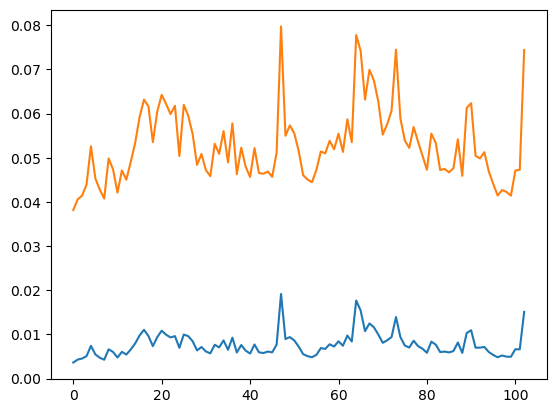

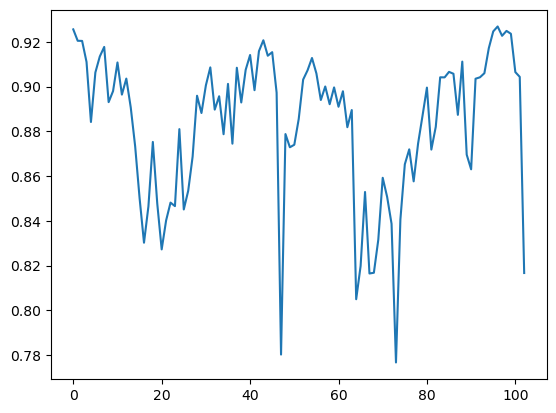

In [70]:
MSE_ConvLSTM_LR =[]
R2_ConvLSTM_LR = []
MAE_ConvLSTM_LR =[]
preds = []
for i in range(len(X_test_flattened)-3):
    pred = ensemble_ConvLSTM_LR[i].reshape(192,128)
    yreal = y_test_flattened[i].reshape(192,128)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_ConvLSTM_LR.append(err)
    R2_ConvLSTM_LR.append(r2)
    MAE_ConvLSTM_LR.append(abs_err)
# print(MSE_ConvLSTM_LR)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_ConvLSTM_LR_rf_vhi.npy", R2_ConvLSTM_LR)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MSE_score_ConvLSTM_LR_rf_vhi.npy", MSE_ConvLSTM_LR)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_score_ConvLSTM_LR_rf_vhi.npy", MAE_ConvLSTM_LR)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/predicted_ConvLSTM_LR_rf_vhi.npy", preds)
#np.save("MSE_for_ConvLSTM_LR.npy", MSE_ConvLSTM_LR)
plt.plot(MSE_ConvLSTM_LR)
plt.plot(MAE_ConvLSTM_LR)
plt.show()
plt.plot(R2_ConvLSTM_LR)

In [71]:
np.mean(R2_ConvLSTM_LR), np.max(R2_ConvLSTM_LR),np.mean(MSE_ConvLSTM_LR), np.mean(MAE_ConvLSTM_LR)

(0.8831179164326771, 0.9268618226784412, 0.0077290935, 0.052795675)

In [74]:
pix2pix_predicted = np.load("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_2\predicted_pi2pix_13000.npy")
pix2pix_predicted_sub = pix2pix_predicted[:-3].reshape(103,192,128)
pix2pix_predicted_sub.shape

(103, 192, 128)

In [75]:
ensemble_ConvLSTM_pix2pix = (pix2pix_predicted_sub+ConvLSTM_predicted)/2
ensemble_ConvLSTM_pix2pix.shape

(103, 192, 128)

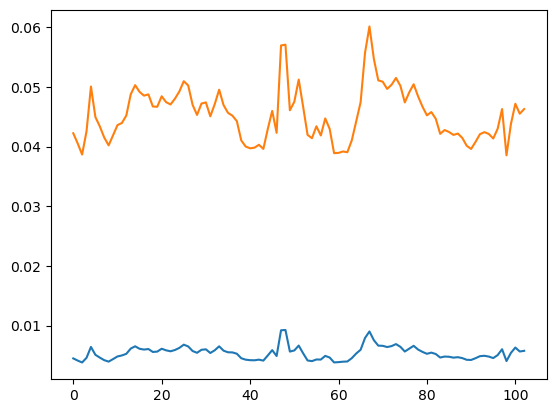

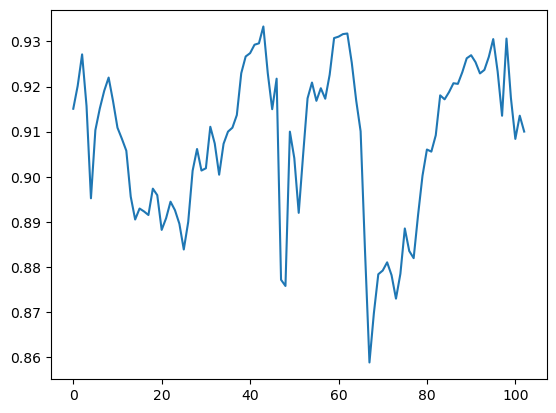

In [76]:
MSE_ConvLSTM_pix2pix =[]
R2_ConvLSTM_pix2pix = []
MAE_ConvLSTM_pix2pix =[]
preds = []
for i in range(len(X_test_flattened)-3):
    pred = ensemble_ConvLSTM_pix2pix[i].reshape(192,128)
    yreal = y_test_flattened[i].reshape(192,128)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_ConvLSTM_pix2pix.append(err)
    R2_ConvLSTM_pix2pix.append(r2)
    MAE_ConvLSTM_pix2pix.append(abs_err)
# print(MSE_ConvLSTM_pix2pix)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_ConvLSTM_pix2pix_rf_vhi.npy", R2_ConvLSTM_pix2pix)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MSE_score_ConvLSTM_pix2pix_rf_vhi.npy", MSE_ConvLSTM_pix2pix)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_score_ConvLSTM_pix2pix_rf_vhi.npy", MAE_ConvLSTM_pix2pix)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/predicted_ConvLSTM_pix2pix_rf_vhi.npy", preds)
#np.save("MSE_for_ConvLSTM_pix2pix.npy", MSE_ConvLSTM_pix2pix)
plt.plot(MSE_ConvLSTM_pix2pix)
plt.plot(MAE_ConvLSTM_pix2pix)
plt.show()
plt.plot(R2_ConvLSTM_pix2pix)

In [77]:
np.mean(R2_ConvLSTM_pix2pix), np.max(R2_ConvLSTM_pix2pix),np.mean(MSE_ConvLSTM_pix2pix), np.mean(MAE_ConvLSTM_pix2pix)

(0.9076496093475371, 0.9333310825704964, 0.0054392386, 0.045385666)

In [ ]:
LR_predicted= np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs\predicted_LR_rf_vhi.npy")
LR_predicted.shape

(106, 192, 128)

In [44]:
ensemble_DT_LR = (DT_predicted+ LR_predicted)/2
ensemble_DT_LR.shape

(106, 192, 128)

In [64]:
ensemble_DT_LR[0][0][0], y_test_flattened[0][0]

(0.0, 0.0)

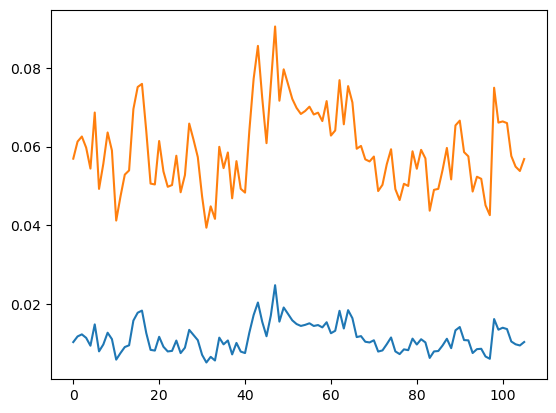

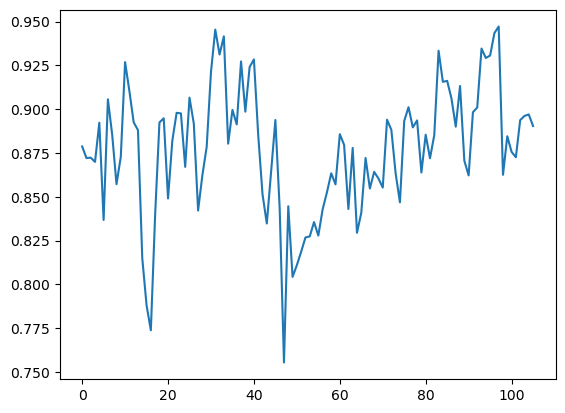

In [54]:
MSE_DT_LR =[]
R2_DT_LR = []
MAE_DT_LR =[]
preds = []
for i in range(len(X_test_flattened)):
    pred = ensemble_DT_LR[i].reshape(192,128)
    yreal = y_test_flattened[i].reshape(192,128)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_DT_LR.append(err)
    R2_DT_LR.append(r2)
    MAE_DT_LR.append(abs_err)
# print(MSE_DT_LR)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_DT_LR_rf_vhi.npy", R2_DT_LR)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MSE_score_DT_LR_rf_vhi.npy", MSE_DT_LR)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_score_DT_LR_rf_vhi.npy", MAE_DT_LR)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/predicted_DT_LR_rf_vhi.npy", preds)
#np.save("MSE_for_DT_LR.npy", MSE_DT_LR)
plt.plot(MSE_DT_LR)
plt.plot(MAE_DT_LR)
plt.show()
plt.plot(R2_DT_LR)

In [55]:
np.mean(R2_DT_LR), np.max(R2_DT_LR),np.mean(MSE_DT_LR), np.mean(MAE_DT_LR)

(0.877083321877712,
 0.9472201529715482,
 0.011452784292876451,
 0.05937853913165646)

In [50]:
pix2pix_predicted = np.load("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi\Pix2pix\model_2\predicted_pi2pix_13000.npy")
pix2pix_predicted.shape

(106, 192, 128, 1)

In [52]:
ensemble_pix2pix_LR = (pix2pix_predicted.reshape(106,192,128)+ LR_predicted)/2
ensemble_pix2pix_LR.shape

(106, 192, 128)

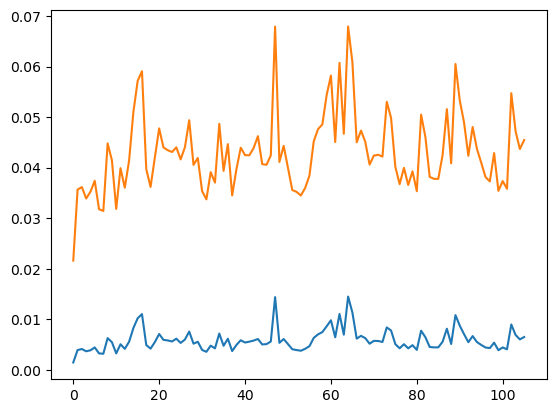

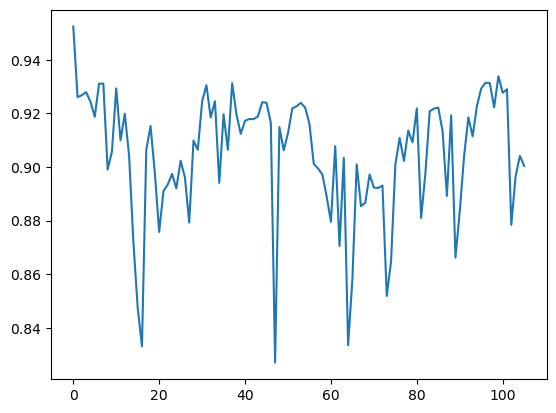

In [56]:
MSE_pix2pix_LR =[]
R2_pix2pix_LR = []
MAE_pix2pix_LR =[]
preds = []
for i in range(len(X_test_flattened)):
    pred = ensemble_pix2pix_LR[i].reshape(192,128)
    yreal = y_test_flattened[i].reshape(192,128)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_pix2pix_LR.append(err)
    R2_pix2pix_LR.append(r2)
    MAE_pix2pix_LR.append(abs_err)
# print(MSE_pix2pix_LR)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_pix2pix_LR_rf_vhi.npy", R2_pix2pix_LR)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MSE_score_pix2pix_LR_rf_vhi.npy", MSE_pix2pix_LR)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_score_pix2pix_LR_rf_vhi.npy", MAE_pix2pix_LR)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/predicted_pix2pix_LR_rf_vhi.npy", preds)
#np.save("MSE_for_pix2pix_LR.npy", MSE_pix2pix_LR)
plt.plot(MSE_pix2pix_LR)
plt.plot(MAE_pix2pix_LR)
plt.show()
plt.plot(R2_pix2pix_LR)

In [57]:
np.mean(R2_pix2pix_LR), np.max(R2_pix2pix_LR),np.mean(MSE_pix2pix_LR), np.mean(MAE_pix2pix_LR)

(0.9049628782463717, 0.952435391349975, 0.0059074378, 0.043053534)

In [58]:
ensemble_pix2pix_DT = (pix2pix_predicted.reshape(106,192,128)+ DT_predicted)/2
ensemble_pix2pix_DT.shape

(106, 192, 128)

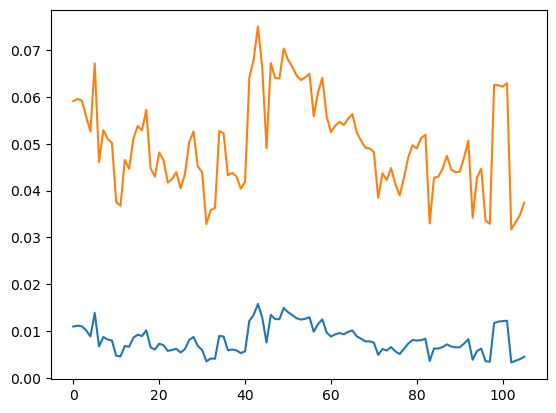

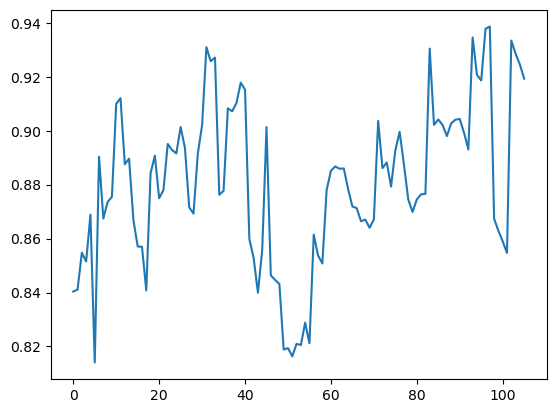

In [59]:
MSE_pix2pix_DT =[]
R2_pix2pix_DT = []
MAE_pix2pix_DT =[]
preds = []
for i in range(len(X_test_flattened)):
    pred = ensemble_pix2pix_DT[i].reshape(192,128)
    yreal = y_test_flattened[i].reshape(192,128)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_pix2pix_DT.append(err)
    R2_pix2pix_DT.append(r2)
    MAE_pix2pix_DT.append(abs_err)
# print(MSE_pix2pix_DT)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_pix2pix_DT_rf_vhi.npy", R2_pix2pix_DT)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MSE_score_pix2pix_DT_rf_vhi.npy", MSE_pix2pix_DT)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_score_pix2pix_DT_rf_vhi.npy", MAE_pix2pix_DT)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/predicted_pix2pix_DT_rf_vhi.npy", preds)
#np.save("MSE_for_pix2pix_DT.npy", MSE_pix2pix_DT)
plt.plot(MSE_pix2pix_DT)
plt.plot(MAE_pix2pix_DT)
plt.show()
plt.plot(R2_pix2pix_DT)

In [60]:
np.mean(R2_pix2pix_DT), np.max(R2_pix2pix_DT),np.mean(MSE_pix2pix_DT), np.mean(MAE_pix2pix_DT)

(0.8806153774411665,
 0.9386478397312652,
 0.008208573991696392,
 0.04995314268933809)

# 1D CNN Model

In [9]:
# split a univariate sequence into samples
def split_sequence(sequence, lab_sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence        
        if end_ix > len(sequence)-3:
            #print(i)
            break
        # if end_ix == 1998:
        #     seq_x, seq_y = sequence[i:end_ix], lab_sequence[1998:]
        # if end_ix == 1999:
        #     seq_x, seq_y = sequence[i:end_ix], test_dataset[0:2]
        # elif end_ix == 2000:
        #     seq_x, seq_y = sequence[i:end_ix], test_dataset[1:3]
        # elif end_ix == 2001:
        #     seq_x, seq_y = sequence[i:end_ix], test_dataset[2:4]
        #else:
        # if end_ix+2 >= 1999:
        #     break
        # else:
        seq_x, seq_y = sequence[i:end_ix], lab_sequence[end_ix+2]
        # gather input and output parts of the pattern
        
        X.append(seq_x)
        y.append(seq_y)
    # X.append(sequence[1997:1999])
    # y.append(test_dataset[0:2])
    return np.array(X), np.array(y), n_steps

In [12]:
X_train, y_train, n_steps = split_sequence(rf_vhi_train, train_dataset,2)
print(X_train.shape, y_train.shape)
# X_train_flattened = X_train.reshape(1999,49152)
# y_train_flattened = y_train.reshape(1999,24576)
# print(X_train_flattened.shape, y_train_flattened.shape)
X_train, y_train = X_train.reshape(1995,2,49152), y_train.reshape(1995,24576)
print(X_train.shape, y_train.shape)


(1995, 2, 192, 128, 2) (1995, 192, 128, 1)
(1995, 2, 49152) (1995, 24576)


In [29]:
# split a univariate sequence into samples
def split_sequence(sequence, lab_sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence        
        if end_ix > len(sequence)-2:
            break
        seq_x, seq_y = sequence[i:end_ix], lab_sequence[end_ix+2]
        # gather input and output parts of the pattern        
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), n_steps

In [15]:
X_test, y_test, n_steps = split_sequence(rf_vhi_test, test_dataset,2)
print(X_test.shape, y_test.shape)
X_test, y_test = X_test.reshape(103,2,49152), y_test.reshape(103,24576)
print(X_test.shape, y_test.shape)

(103, 2, 192, 128, 2) (103, 192, 128, 1)
(103, 2, 49152) (103, 24576)


In [25]:
from numpy import array
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
# define model
n_features = X_train.shape[2]
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], n_features))
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, n_features)))
# model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(24576))
model.compile(optimizer='sgd', loss='mse', metrics=['mse'])
# fit model
history= model.fit(X_train, y_train, epochs=100, validation_data=(X_test, y_test))
np.save("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi/1dcnn_rfvhi.npy", history.history)
model.save("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi/1dcnn_model_rfvhi.h5")
# demonstrate prediction

Epoch 1/100
63/63 [==============================] - 1s 17ms/step - loss: 0.1828 - mse: 0.1828 - val_loss: 0.2336 - val_mse: 0.2336
Epoch 2/100
63/63 [==============================] - 1s 15ms/step - loss: 0.1826 - mse: 0.1826 - val_loss: 0.2335 - val_mse: 0.2335
Epoch 3/100
63/63 [==============================] - 1s 15ms/step - loss: 0.1826 - mse: 0.1826 - val_loss: 0.2334 - val_mse: 0.2334
Epoch 4/100
63/63 [==============================] - 1s 15ms/step - loss: 0.1825 - mse: 0.1825 - val_loss: 0.2334 - val_mse: 0.2334
Epoch 5/100
63/63 [==============================] - 1s 15ms/step - loss: 0.1825 - mse: 0.1825 - val_loss: 0.2333 - val_mse: 0.2333
Epoch 6/100
63/63 [==============================] - 1s 15ms/step - loss: 0.1824 - mse: 0.1824 - val_loss: 0.2333 - val_mse: 0.2333
Epoch 7/100
63/63 [==============================] - 1s 15ms/step - loss: 0.1824 - mse: 0.1824 - val_loss: 0.2332 - val_mse: 0.2332
Epoch 8/100
63/63 [==============================] - 1s 14ms/step - loss: 0.

In [46]:
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import History 
from tensorflow import keras
import tensorflow_addons as tfa
model_1dcnn = load_model("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi/1dcnn_model_rfvhi.h5")
history_1dcnn = np.load("F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi/1dcnn_rfvhi.npy",allow_pickle=True).item()
history_1dcnn.keys()

dict_keys(['loss', 'mse', 'val_loss', 'val_mse'])

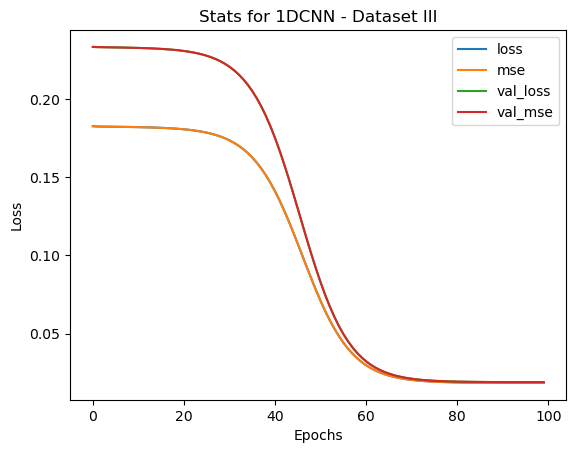

In [47]:
# Results of updated model6

plt.plot(history_1dcnn['loss'])
plt.plot(history_1dcnn['mse'])
plt.plot(history_1dcnn['val_loss'])
plt.plot(history_1dcnn['val_mse'])

plt.title('Stats for 1DCNN - Dataset III')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['loss','mse','val_loss','val_mse'])
plt.show()

(1, 24576)
0.7417940436013007


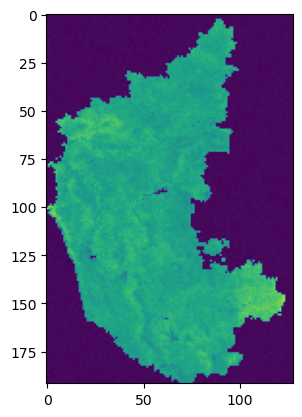

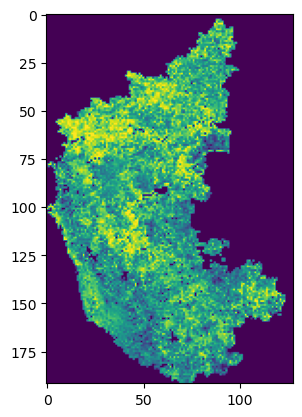

In [28]:
model = model_1dcnn
from sklearn.metrics import r2_score
framed = X_test[5]
pred = model.predict(np.expand_dims(framed, axis=0))
print(pred.shape)
y_real = y_test[5].reshape(192,128)
pred = pred.reshape(192,128)
r2 = r2_score(y_real,pred)
print(r2)
plt.imshow(pred.reshape(192,128))
plt.figure()
plt.imshow(y_real.reshape(192,128))

In [30]:
# data_test = load_real_samples("F:\Jyoti Shukla -MS\karnataka dataset\Padded_paired_unscaled_test_total_AVHRR_data_1981_2022.npz")
# test_data, test_label = data_test[0], data_test[1]
#print(test_data.shape, test_label.shape)
print(test_data.shape)
# vhi_train, vhi_train_label, n_steps = split_sequence(train_data, 4)
vhi_test, vhi_test_label, n_steps = split_sequence(rf_vhi_test, test_data, 2)
# print("Training Dataset Shapes: " + str(vhi_train.shape) + ", " + str(vhi_train_label.shape))
print("Validation Dataset Shapes: " + str(vhi_test.shape) + ", " + str(vhi_test_label.shape))

(123, 192, 128)
Validation Dataset Shapes: (103, 2, 192, 128, 2), (103, 192, 128)


In [34]:
# unscaling values
from sklearn.preprocessing import MinMaxScaler
def unscale(mat, VHI_test):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(VHI_test)
  unscaled = scaler.inverse_transform(mat.reshape(VHI_test.shape[0],VHI_test.shape[1]))
  return unscaled

In [36]:
def colorcoding(mat):
  for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
      #print(mat[i][j])
      if  mat[i][j] >80:
        mat[i][j] = 255
      # elif (mat[i][j]<80) &(mat[i][j] >70):             # Abnormally Dry
      #   mat[i][j]= 128
      elif (mat[i][j]<80) &(mat[i][j] >60):             # Abnormally Dry
        mat[i][j]= 128
      # elif (mat[i][j]<60) &(mat[i][j] >50):             # Abnormally Dry
      #   mat[i][j]= 64
      elif (mat[i][j]<60) &(mat[i][j] >40):             # Abnormally Dry
        mat[i][j]= 64
      # elif (mat[i][j]<40) &(mat[i][j] >30):             # Abnormally Dry
      #   mat[i][j]= 16
      elif (mat[i][j]<40) &(mat[i][j]>20):              # Moderate drought
        mat[i][j] = 32
      # elif (mat[i][j]<20) & (mat[i][j]>10):             # Severe drought
      #   mat[i][j] = 4
      elif (mat[i][j])<20:                              # Extreme  drought
        mat[i][j]= 0
  return mat

Text(0.5, 0.98, '1D- CNN Outputs')

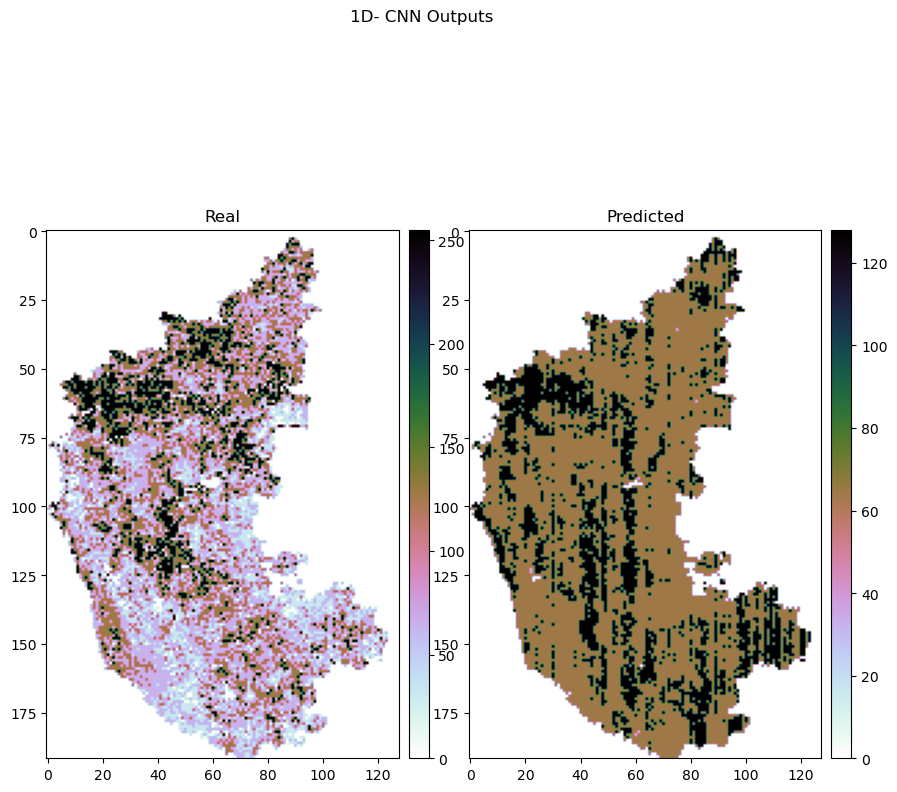

In [38]:
pred = pred.reshape(192,128,1)
y_real = y_real.reshape(192,128,1)
unscale_pred = unscale(pred,vhi_test_label[5])
unscale_real = unscale(y_real,vhi_test_label[5])
colorcoded_pred = colorcoding(unscale_pred)
colorcoded_real = colorcoding(unscale_real)
images = [colorcoded_real, colorcoded_pred]
titles =["Real","Predicted"]
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
for i in range(len(images)):
    pos = ax[i].imshow(images[i].reshape(192,128), cmap="cubehelix_r")
    #ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax[i].get_position().x1+0.01,ax[i].get_position().y0,0.02,ax[i].get_position().height])
    fig.colorbar(pos, ax = ax[i], cax =cax)
    ax[i].set_title(titles[i])
    #ax.axis("off")
fig.suptitle("1D- CNN Outputs")

In [39]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
data = X_test
label = y_test
predicted_mod =[]
true = []
R2_mod =[]
res_mod = []
mse_mod =[]
for i in range(len(data)):
    #for j in range(4):
    framed = data[i]
    y_real = label[i].reshape(192,128)
    # test = framed.reshape(1,1,192,128,1)
    pred = model.predict(np.expand_dims(framed, axis=0))
    pred = pred.reshape(192,128)
    r2 = r2_score(y_real,pred)
    residual = mae(y_real,pred)
    res_mod.append(residual)
    err = mse(y_real,pred)
    mse_mod.append(err)
    predicted_mod.append(pred)
    true.append(y_real)
    R2_mod.append(r2)
        
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_1DCNN_rfvhi.npy", R2_mod)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_for_1DCNN_rfvhi.npy",res_mod)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MSE_for_1DCNN_rfvhi.npy",mse_mod)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/Predicted_outputs_1DCNN_rfvhi.npy", predicted_mod)
# r2 = r2_score(y_real, pred)
print(len(R2_mod))
print('r2 score for test data on model is: \n', R2_mod)

103
r2 score for test data on model is: 
 [0.7281205300446046, 0.7134068336547126, 0.7100414381316877, 0.709331752278583, 0.7158919899563536, 0.7417940436013007, 0.7587595728065437, 0.7673007962373707, 0.7764477440154217, 0.7861840216786111, 0.7922436007240086, 0.7920604445168401, 0.799188709233414, 0.7996042111633388, 0.7933887331506723, 0.7974203878892773, 0.805450566831371, 0.8059741564902961, 0.8048943038530025, 0.8040443219401286, 0.8093527146345738, 0.8086164354148868, 0.7997065192156847, 0.7887496719602187, 0.7817930524156778, 0.773177728209637, 0.7651511681488631, 0.7513183185837953, 0.7405572567589869, 0.7403893921584082, 0.7344280099325352, 0.7445202812774998, 0.7534578545428243, 0.7543323674807386, 0.7579946165697304, 0.7628924107354257, 0.7635857721840662, 0.7687862191226033, 0.7774311777408895, 0.7814285617659075, 0.7830743047252886, 0.7927484432561415, 0.7994076182132656, 0.8047901676222009, 0.7829976102528565, 0.7190737588574433, 0.7039190155771635, 0.7016750569539659, 0

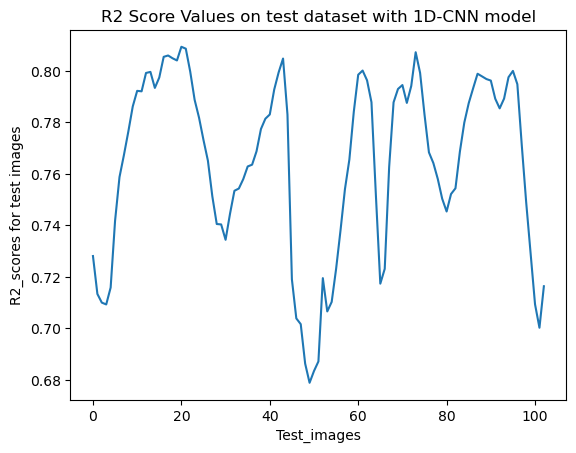

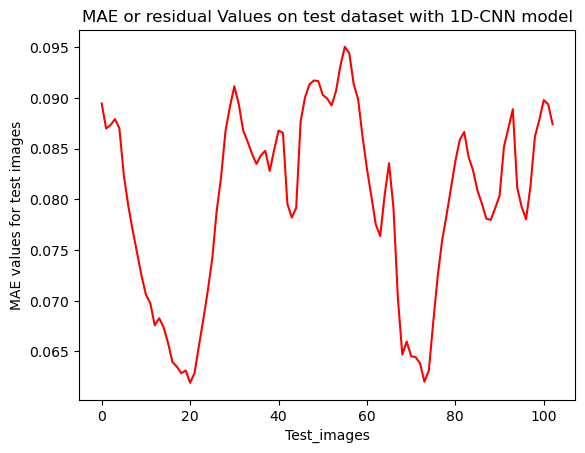

Text(0.5, 1.0, 'MSE Values on test dataset with 1D-CNN model')

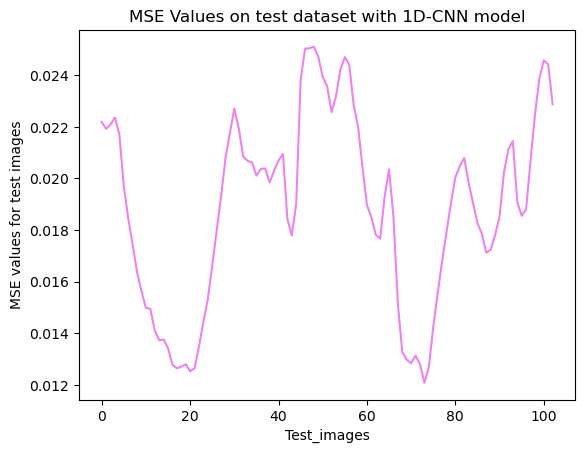

In [40]:
R2 = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_1DCNN_rfvhi.npy")
res = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_for_1DCNN_rfvhi.npy")
MSE = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MSE_for_1DCNN_rfvhi.npy")
plt.plot(R2)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with 1D-CNN model")
plt.show()
plt.plot(res,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with 1D-CNN model")
plt.show()
plt.plot(MSE, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with 1D-CNN model")

In [41]:
np.mean(R2), np.max(R2), np.mean(MSE), np.mean(res)

(0.7641953655499425, 0.8093527146345738, 0.018865768, 0.07993805)

# BiLSTM

In [7]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential, layers, callbacks
from tensorflow.keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
from numpy import array
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D

In [8]:
# split a univariate sequence into samples
def split_sequence(sequence, lab_sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence        
        if end_ix > len(sequence)-3:
            #print(i)
            break
        # if end_ix == 1998:
        #     seq_x, seq_y = sequence[i:end_ix], lab_sequence[1998:]
        # if end_ix == 1999:
        #     seq_x, seq_y = sequence[i:end_ix], test_dataset[0:2]
        # elif end_ix == 2000:
        #     seq_x, seq_y = sequence[i:end_ix], test_dataset[1:3]
        # elif end_ix == 2001:
        #     seq_x, seq_y = sequence[i:end_ix], test_dataset[2:4]
        #else:
        # if end_ix+2 >= 1999:
        #     break
        # else:
        seq_x, seq_y = sequence[i:end_ix], lab_sequence[end_ix+2]
        # gather input and output parts of the pattern
        
        X.append(seq_x)
        y.append(seq_y)
    # X.append(sequence[1997:1999])
    # y.append(test_dataset[0:2])
    return np.array(X), np.array(y), n_steps
X_train, y_train, n_steps = split_sequence(rf_vhi_train, train_dataset,2)
print(X_train.shape, y_train.shape)
# X_train_flattened = X_train.reshape(1999,49152)
# y_train_flattened = y_train.reshape(1999,24576)
# print(X_train_flattened.shape, y_train_flattened.shape)
X, y = X_train.reshape(1995,2,49152), y_train.reshape(1995,24576)
print(X.shape, y.shape)


(1995, 2, 192, 128, 2) (1995, 192, 128, 1)
(1995, 2, 49152) (1995, 24576)


In [9]:
# split a univariate sequence into samples
def split_sequence(sequence, lab_sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence        
        if end_ix > len(sequence)-2:
            break
        seq_x, seq_y = sequence[i:end_ix], lab_sequence[end_ix+2]
        # gather input and output parts of the pattern        
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), n_steps
X_test, y_test, n_steps = split_sequence(rf_vhi_test, test_dataset,2)
print(X_test.shape, y_test.shape)
XTest, YTest = X_test.reshape(103,2,49152), y_test.reshape(103,24576)
print(XTest.shape, YTest.shape)

(103, 2, 192, 128, 2) (103, 192, 128, 1)
(103, 2, 49152) (103, 24576)


In [10]:
n_features = X.shape[2]
X = X.reshape((X.shape[0], X.shape[1], n_features))
model = Sequential()
    # Input layer
model.add(Bidirectional(LSTM(units = 50, return_sequences=True), input_shape=(n_steps, n_features)))
model.add(Bidirectional(LSTM(units = 1200, return_sequences=True), input_shape=(n_steps, n_features)))
model.add(Bidirectional(LSTM(units = 200)))
model.add(Dense(24576))
#Compile model
model.compile(optimizer='adam',loss='mae',metrics=['mse'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional (Bidirectional (None, 2, 100)            19681200  
_________________________________________________________________
bidirectional_1 (Bidirection (None, 2, 2400)           12489600  
_________________________________________________________________
bidirectional_2 (Bidirection (None, 400)               4161600   
_________________________________________________________________
dense (Dense)                (None, 24576)             9854976   
Total params: 46,187,376
Trainable params: 46,187,376
Non-trainable params: 0
_________________________________________________________________


In [11]:
# early_stop = keras.callbacks.EarlyStopping(monitor = ‘val_loss’,
#                                                patience = 10)
history = model.fit(X, y, epochs=30, validation_data=(XTest, YTest), verbose=2)
np.save(r"F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi/BiLSTM_history_rfvhi.npy", history.history)
model.save(r"F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi/BiLSTM_rfvhi.h5")

Epoch 1/30
63/63 - 13s - loss: 0.1527 - mse: 0.0708 - val_loss: 0.0927 - val_mse: 0.0241
Epoch 2/30
63/63 - 2s - loss: 0.0857 - mse: 0.0212 - val_loss: 0.0926 - val_mse: 0.0248
Epoch 3/30
63/63 - 2s - loss: 0.0852 - mse: 0.0213 - val_loss: 0.0875 - val_mse: 0.0225
Epoch 4/30
63/63 - 2s - loss: 0.0846 - mse: 0.0212 - val_loss: 0.0880 - val_mse: 0.0230
Epoch 5/30
63/63 - 2s - loss: 0.0845 - mse: 0.0213 - val_loss: 0.0892 - val_mse: 0.0235
Epoch 6/30
63/63 - 2s - loss: 0.0848 - mse: 0.0214 - val_loss: 0.0864 - val_mse: 0.0223
Epoch 7/30
63/63 - 2s - loss: 0.0840 - mse: 0.0212 - val_loss: 0.0890 - val_mse: 0.0236
Epoch 8/30
63/63 - 2s - loss: 0.0839 - mse: 0.0212 - val_loss: 0.0879 - val_mse: 0.0231
Epoch 9/30
63/63 - 2s - loss: 0.0841 - mse: 0.0213 - val_loss: 0.0871 - val_mse: 0.0227
Epoch 10/30
63/63 - 2s - loss: 0.0838 - mse: 0.0212 - val_loss: 0.0869 - val_mse: 0.0227
Epoch 11/30
63/63 - 2s - loss: 0.0839 - mse: 0.0213 - val_loss: 0.0905 - val_mse: 0.0244
Epoch 12/30
63/63 - 2s - loss

In [13]:
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import History 
from tensorflow import keras
import tensorflow_addons as tfa
model_BiLSTM = load_model(r"F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi/BiLSTM_rfvhi.h5")
history_BiLSTM = np.load(r"F:\Jyoti Shukla -MS\codes\Saved_models_and_model_history_rf_vhi/BiLSTM_history_rfvhi.npy",allow_pickle=True).item()
history_BiLSTM.keys()

dict_keys(['loss', 'mse', 'val_loss', 'val_mse'])

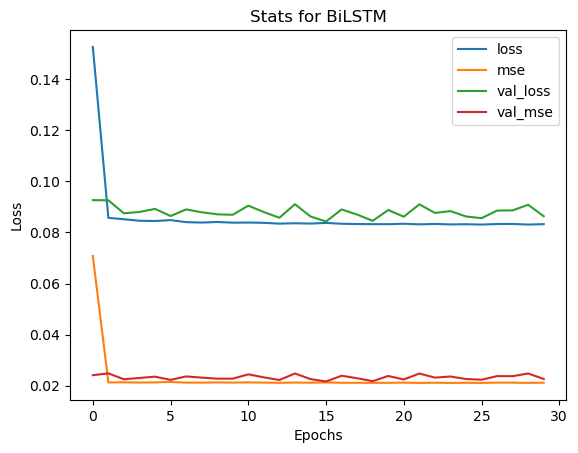

In [14]:
# Results of updated model6

plt.plot(history_BiLSTM['loss'])
plt.plot(history_BiLSTM['mse'])
plt.plot(history_BiLSTM['val_loss'])
plt.plot(history_BiLSTM['val_mse'])

plt.title('Stats for BiLSTM')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['loss','mse','val_loss','val_mse'])
plt.show()

In [22]:
framed = XTest[5]
test= (np.expand_dims(framed, axis=0))
test.shape

(1, 2, 49152)

(1, 24576)
0.737702149766077


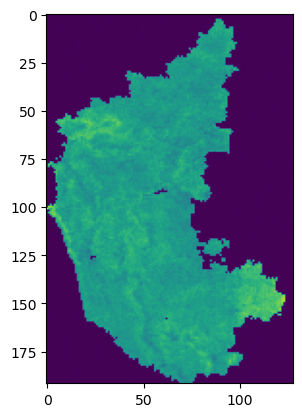

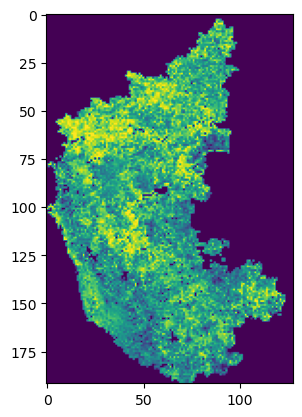

In [23]:
model = model_BiLSTM
from sklearn.metrics import r2_score
framed = X_test[5]
pred = model.predict(test)
print(pred.shape)
y_real = y_test[5].reshape(192,128)
pred = pred.reshape(192,128)
r2 = r2_score(y_real,pred)
print(r2)
plt.imshow(pred.reshape(192,128))
plt.figure()
plt.imshow(y_real.reshape(192,128))

In [ ]:
# data_test = load_real_samples("F:\Jyoti Shukla -MS\karnataka dataset\Padded_paired_unscaled_test_total_AVHRR_data_1981_2022.npz")
# test_data, test_label = data_test[0], data_test[1]
#print(test_data.shape, test_label.shape)
print(test_data.shape)
# vhi_train, vhi_train_label, n_steps = split_sequence(train_data, 4)
vhi_test, vhi_test_label, n_steps = split_sequence(rf_vhi_test, test_data, 2)
# print("Training Dataset Shapes: " + str(vhi_train.shape) + ", " + str(vhi_train_label.shape))
print("Validation Dataset Shapes: " + str(vhi_test.shape) + ", " + str(vhi_test_label.shape))

(123, 192, 128)
Validation Dataset Shapes: (103, 2, 192, 128, 2), (103, 192, 128)


In [ ]:
# unscaling values
from sklearn.preprocessing import MinMaxScaler
def unscale(mat, VHI_test):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(VHI_test)
  unscaled = scaler.inverse_transform(mat.reshape(VHI_test.shape[0],VHI_test.shape[1]))
  return unscaled

In [ ]:
def colorcoding(mat):
  for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
      #print(mat[i][j])
      if  mat[i][j] >80:
        mat[i][j] = 255
      # elif (mat[i][j]<80) &(mat[i][j] >70):             # Abnormally Dry
      #   mat[i][j]= 128
      elif (mat[i][j]<80) &(mat[i][j] >60):             # Abnormally Dry
        mat[i][j]= 128
      # elif (mat[i][j]<60) &(mat[i][j] >50):             # Abnormally Dry
      #   mat[i][j]= 64
      elif (mat[i][j]<60) &(mat[i][j] >40):             # Abnormally Dry
        mat[i][j]= 64
      # elif (mat[i][j]<40) &(mat[i][j] >30):             # Abnormally Dry
      #   mat[i][j]= 16
      elif (mat[i][j]<40) &(mat[i][j]>20):              # Moderate drought
        mat[i][j] = 32
      # elif (mat[i][j]<20) & (mat[i][j]>10):             # Severe drought
      #   mat[i][j] = 4
      elif (mat[i][j])<20:                              # Extreme  drought
        mat[i][j]= 0
  return mat

Text(0.5, 0.98, '1D- CNN Outputs')

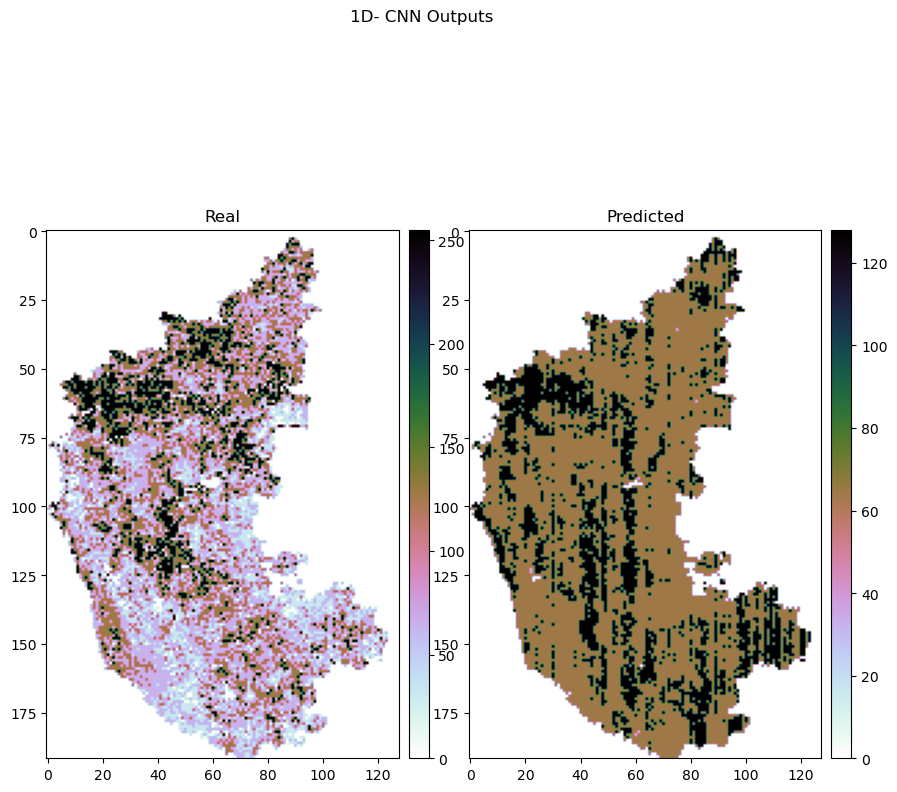

In [ ]:
pred = pred.reshape(192,128,1)
y_real = y_real.reshape(192,128,1)
unscale_pred = unscale(pred,vhi_test_label[5])
unscale_real = unscale(y_real,vhi_test_label[5])
colorcoded_pred = colorcoding(unscale_pred)
colorcoded_real = colorcoding(unscale_real)
images = [colorcoded_real, colorcoded_pred]
titles =["Real","Predicted"]
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
for i in range(len(images)):
    pos = ax[i].imshow(images[i].reshape(192,128), cmap="cubehelix_r")
    #ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax[i].get_position().x1+0.01,ax[i].get_position().y0,0.02,ax[i].get_position().height])
    fig.colorbar(pos, ax = ax[i], cax =cax)
    ax[i].set_title(titles[i])
    #ax.axis("off")
fig.suptitle("1D- CNN Outputs")

In [26]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
data = XTest
label = YTest
predicted_mod =[]
true = []
R2_mod =[]
res_mod = []
mse_mod =[]
for i in range(len(data)):
    #for j in range(4):
    framed = data[i]
    y_real = label[i].reshape(192,128)
    # test = np.expand_dims(framed, axis=0)
    pred = model.predict(np.expand_dims(framed, axis=0))
    pred = pred.reshape(192,128)
    r2 = r2_score(y_real,pred)
    residual = mae(y_real,pred)
    res_mod.append(residual)
    err = mse(y_real,pred)
    mse_mod.append(err)
    predicted_mod.append(pred)
    true.append(y_real)
    R2_mod.append(r2)
        
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_bilstm_rfvhi.npy", R2_mod)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_for_bilstm_rfvhi.npy",res_mod)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MSE_for_bilstm_rfvhi.npy",mse_mod)
np.save("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/Predicted_outputs_bilstm_rfvhi.npy", predicted_mod)
# r2 = r2_score(y_real, pred)
print(len(R2_mod))
print('r2 score for test data on model is: \n', R2_mod)

103
r2 score for test data on model is: 
 [0.7131855770485802, 0.7149419653350746, 0.7121394582978711, 0.713453293847661, 0.7224272336161807, 0.737702149766077, 0.7512005223671867, 0.757535762400235, 0.7653126359792939, 0.7710083942904714, 0.7752945175898578, 0.7775698377784551, 0.78950424027285, 0.7971096762153195, 0.7990424929165789, 0.7998598283238887, 0.8004072492999612, 0.7986416335052966, 0.7961952596289977, 0.7930111409743856, 0.796196091948517, 0.7937948469879028, 0.7857960815898728, 0.775534570330031, 0.7676513355266283, 0.7537559236568703, 0.7419542482900844, 0.7290050772696448, 0.7151189101387475, 0.7069821926371, 0.7008690789553746, 0.7126535693250879, 0.7202253418175799, 0.7201628178164106, 0.7205521615957716, 0.7246096948691026, 0.7194178777429552, 0.713042031649737, 0.7137150903293907, 0.7014245223128275, 0.6905913535451752, 0.6702847311353538, 0.6976032532947308, 0.7025389359182022, 0.7151917689177087, 0.7271540220091148, 0.7263259338335711, 0.7233126439644146, 0.714723

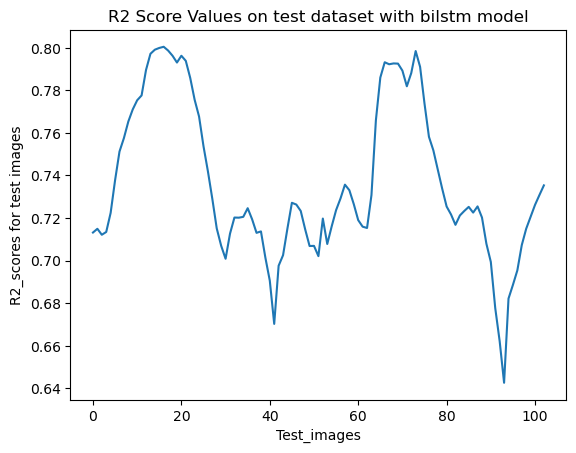

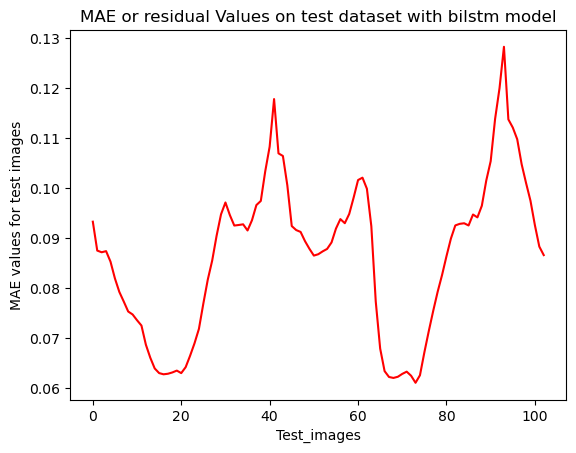

Text(0.5, 1.0, 'MSE Values on test dataset with bilstm model')

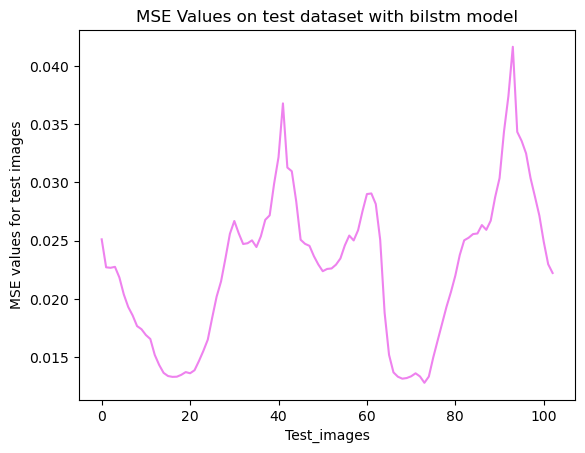

In [27]:
R2 = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/R2_score_bilstm_rfvhi.npy")
res = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MAE_for_bilstm_rfvhi.npy")
MSE = np.load("F:\Jyoti Shukla -MS\codes\Rf_VHI_model_outputs/MSE_for_bilstm_rfvhi.npy")
plt.plot(R2)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with bilstm model")
plt.show()
plt.plot(res,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with bilstm model")
plt.show()
plt.plot(MSE, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with bilstm model")

In [28]:
np.mean(R2), np.max(R2), np.mean(MSE), np.mean(res)

(0.7366833705707702, 0.8004072492999612, 0.022605736, 0.08635341)